#COMP 551 - Assignment 2
**Group Number:** 8<br><br>
**Members:**
  * **Ayaz Ciplak** - 261013785<br>
  * **Jacqueline Silver** - 261012002<br>
  * **Christopher Smith** - 261013926<br><br>

***Notes:***
  * *Rename/save this file as code.ipynb before submitting*

### Task "0": Environment Configuration

**In this section, we will provide code for all necessary preconfigurations for this project. This includes:**
* Downloading dependencies
* Importing necessary libraries

In [ ]:
# Imports
import numpy as np
import matplotlib.pyplot as plt
from IPython.core.debugger import set_trace
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import itertools

### Task 1: Linear Regression with Non-Linear Basis Functions

**This section includes the following subsections:**
* Data Generation
* Non-Linear Basis Functions
* Model Fitting
* Model Selection
* Explanation

#### **1.1 - Data Generation**

In this subsection, we will generate 100 data points sampled from a non-linear function. This should simulate real-world noisy data.

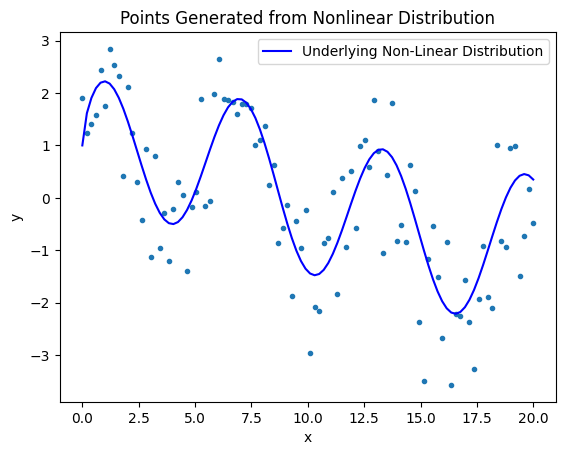

In [ ]:
def gen_data():
  num_points = 100
  x_entries = np.linspace(0, 20, num_points)
  unbiased_y_entries = np.sin(np.sqrt(x_entries)) + np.cos(x_entries) + np.sin(x_entries) # Nonlinear distribution funciton
  y_entries = unbiased_y_entries + np.random.randn(num_points)

  return x_entries, y_entries, unbiased_y_entries


x_entries, y_entries, unbiased_y_entries = gen_data()

plt.plot(x_entries, y_entries, '.')
plt.plot(x_entries, unbiased_y_entries, 'b-', label='Underlying Non-Linear Distribution')
plt.title("Points Generated from Nonlinear Distribution")
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()



#### **1.2 - Non-Linear Basis Functions Illustration**

In this subsection, we will fit a linear regression model to our data. However, we will first transform our original features using Gaussian basis functions of the form:
$$
\phi (x, \mu, \sigma) = exp(-\frac{(x - μ)^2}{σ^2})
$$

We will illustrate the gaussian basis functions used in the range of 0 to 110, in increments of 10.

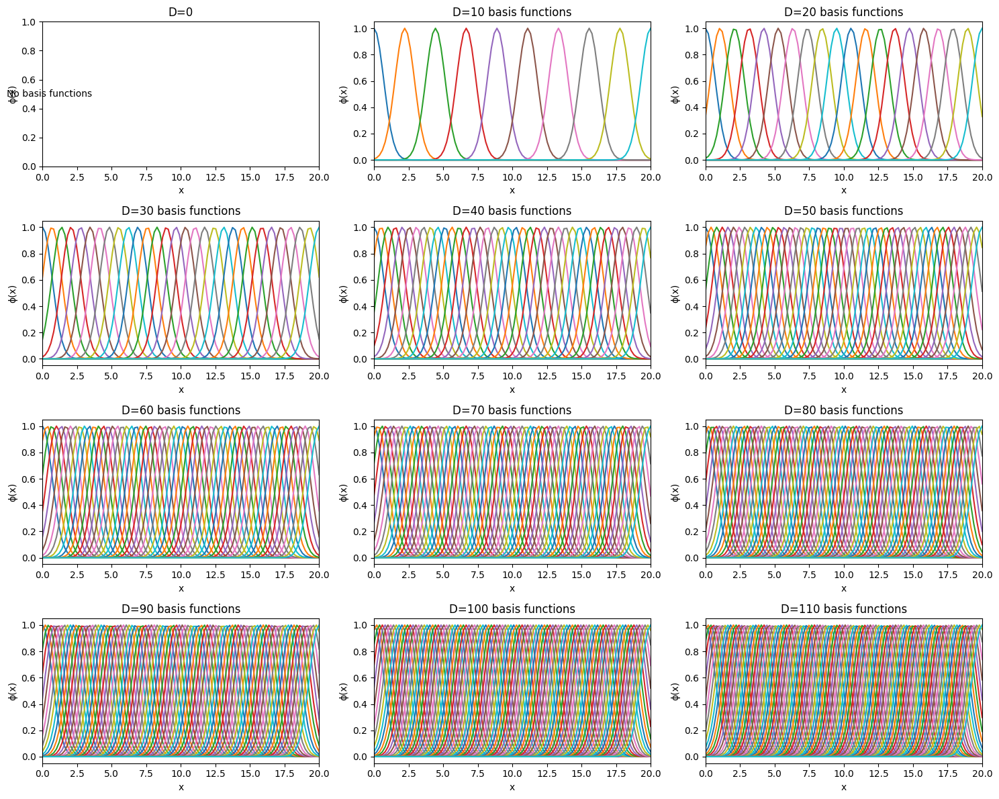

In [ ]:
def gaussian(x, mu, sigma=1.0):
  """
    Returns the value of x modified according to a
    gaussian function with mu (center) and sigma (stdev -- Default value 1).
  """
  return np.exp(-((x-mu)/sigma)**2)


# Define grid of subplots
fig_gaussian, axes_gaussian = plt.subplots(4, 3, figsize=(15, 12))
axes_gaussian = axes_gaussian.ravel() # Flatten axes for easy iteration
phis = [] # Store Gaussian base configurations for D = 0, 10, ..., 110


for i, D in enumerate(range(0, 111, 10)):

    if D == 0: # Plot an empty graph
        axes_gaussian[i].text(0.5, 0.5, "No basis functions", horizontalalignment='center', verticalalignment='center')
        axes_gaussian[i].set_title(f"D={D}")
        axes_gaussian[i].set_xlabel('x')
        axes_gaussian[i].set_ylabel('ϕ(x)')
        axes_gaussian[i].set_xlim([0, 20])
        axes_gaussian[i].set_ylim([0, 1])
        phis.append([])
        continue

    # Define mean values for the Gaussian functions
    mu = np.linspace(0, 20, D)

    # Compute the Gaussian basis functions for each mu
    phi = gaussian(x_entries[:, None], mu[None, :], sigma=1.0)
    phis.append(phi)

    # Plot the Gaussian basis functions for the current D
    for d in range(D):
        axes_gaussian[i].plot(x_entries, phi[:, d], '-')

    axes_gaussian[i].set_title(f"D={D} basis functions")
    axes_gaussian[i].set_xlabel('x')
    axes_gaussian[i].set_ylabel('ϕ(x)')
    axes_gaussian[i].set_xlim([0, 20])


plt.tight_layout() # Adjust layout to avoid overlapping labels
plt.show()


#### **1.3 - Model Fitting with Non-Linear Basis Functions**

In this section, we will fit linear regression models to our data using Gaussian bases. The number of bases used will reflect what was analysed in part 1.2, i.e. models with 0, 10, ..., 110 bases.

* For each model, we will compute and plot the predictions alongside the generated data points and true function.


First, we define our Linear Regression class.

In [ ]:
# Analytical Linear Regression model implementation
class LinearRegression:
    def __init__(self, add_bias=True):
        self.add_bias = add_bias
        pass

    def fit(self, x, y):
        if x.ndim == 1:
            x = x[:, None]                         #add a dimension for the features
        N = x.shape[0]
        if self.add_bias:
            x = np.column_stack([x,np.ones(N)])    #add bias by adding a constant feature of value 1
        self.w = np.linalg.inv(x.T @ x)@x.T@y
        #self.w = np.linalg.lstsq(x, y)[0]          #return w for the least square difference
        return self

    def predict(self, x):
        if x.ndim == 1:
            x = x[:, None]
        if self.add_bias:
            N = x.shape[0]
            x = np.column_stack([x,np.ones(N)])
        yh = x@self.w                             #predict the y values
        return yh


Now, we can initialize our linear regression model and fit it to our data using varying numbers of bases.

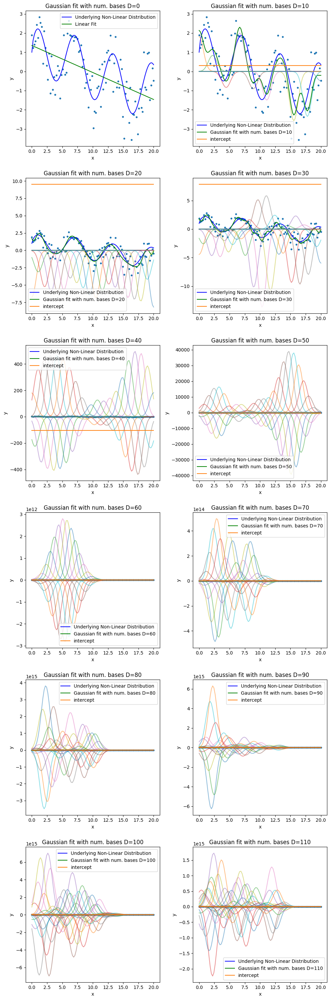

In [ ]:
linear_model = LinearRegression() #Initialize model

# Define grid of subplots
fig_gaussian, axes_gaussian = plt.subplots(6, 2, figsize=(10, 30))
axes_gaussian = axes_gaussian.ravel() # Flatten axes for easy iteration

for i, D in enumerate(range(0, 111, 10)):

  if D == 0: # Perform linear regression without Gaussian bases
    yh = linear_model.fit(x_entries, y_entries).predict(x_entries)
    axes_gaussian[i].plot(x_entries, y_entries, '.')
    axes_gaussian[i].plot(x_entries, unbiased_y_entries, 'b-', label='Underlying Non-Linear Distribution')
    axes_gaussian[i].plot(x_entries, yh, 'g-', label='Linear Fit')
    axes_gaussian[i].set_xlabel('x')
    axes_gaussian[i].set_ylabel('y')
    axes_gaussian[i].legend()
    axes_gaussian[i].set_title(f"Gaussian fit with num. bases D={D}")
    continue

  # Perform linear regression with D evenly-spaced Gaussian bases
  yh = linear_model.fit(phis[i], y_entries).predict(phis[i])
  axes_gaussian[i].plot(x_entries, y_entries, '.') # Plot all pregenerated data points
  axes_gaussian[i].plot(x_entries, unbiased_y_entries, 'b-', label='Underlying Non-Linear Distribution')
  axes_gaussian[i].plot(x_entries, yh, 'g-', label=f'Gaussian fit with num. bases D={D}')
  for d in range(D):
    axes_gaussian[i].plot(x_entries, linear_model.w[d]*phis[i][:,d], '-', alpha=.5)  # Plot all individual gaussian bases

  axes_gaussian[i].plot(x_entries, linear_model.w[-1]*np.ones_like(y_entries), label='intercept')
  axes_gaussian[i].legend()
  axes_gaussian[i].set_xlabel('x')
  axes_gaussian[i].set_ylabel('y')
  axes_gaussian[i].set_title(f"Gaussian fit with num. bases D={D}")

plt.tight_layout() # Adjust layout to avoid overlapping labels
plt.show()


#### **1.4 - Model Selection**

Split the data into a training set and a validation set. For each model (with different numbers of basis functions), compute the sum of squared errors (SSE) on both the training and validation sets. Identify the number of Gaussian bases that minimizes the validation SSE. This will help you choose the optimal model complexity by balancing underfitting and overfitting. This subsection includes the following sections:
* Shuffling and splitting our data
* Training each model (from bases = 0, ..., 110) on the train data
* Performance analysis on the train and test (validation) sets

In [ ]:
# Assuming x_entries and y_entries are NumPy arrays
# Shuffle indices
indices = np.arange(x_entries.shape[0])
np.random.shuffle(indices)

# Split at 80% of the total data
split_index = int(0.8 * len(indices))

# Split the data
x_train = x_entries[indices[:split_index]]
x_test = x_entries[indices[split_index:]]
y_train = y_entries[indices[:split_index]]
y_test = y_entries[indices[split_index:]]


We will now train our models using numbers of Gaussian bases D = 0, 10, ..., 110. After each model is trained, we will analyse performance by computing the sum of squared errors (SSE) on the train and test sets, according to the formula

$$
J(w) =  \frac{1}{2} \sum_n (y^{(n)} - w^\top x^{(n)})^2
$$


SSE Metrics for model using 0 Gaussian bases
Train SSE: 70.16510815517421
Test SSE: 10.34440486779117
Train MSE: 0.8770638519396776
Test MSE 0.5172202433895585

SSE Metrics for model using 10 Gaussian bases
Train SSE: 35.44459546970391
Test SSE: 15.776746349775776
Train MSE: 0.44305744337129893
Test MSE 0.7888373174887888

SSE Metrics for model using 20 Gaussian bases
Train SSE: 21.85944930248136
Test SSE: 14.505396139669747
Train MSE: 0.273243116281017
Test MSE 0.7252698069834873

SSE Metrics for model using 30 Gaussian bases
Train SSE: 19.074836849387268
Test SSE: 25.20335366798996
Train MSE: 0.23843546061734083
Test MSE 1.260167683399498

SSE Metrics for model using 40 Gaussian bases
Train SSE: 15.768553104318292
Test SSE: 22.67614081711781
Train MSE: 0.19710691380397866
Test MSE 1.1338070408558905

SSE Metrics for model using 50 Gaussian bases
Train SSE: 12.658498298611935
Test SSE: 66822.38271302496
Train MSE: 0.1582312287326492
Test MSE 3341.1191356512477

SSE Metrics for model 

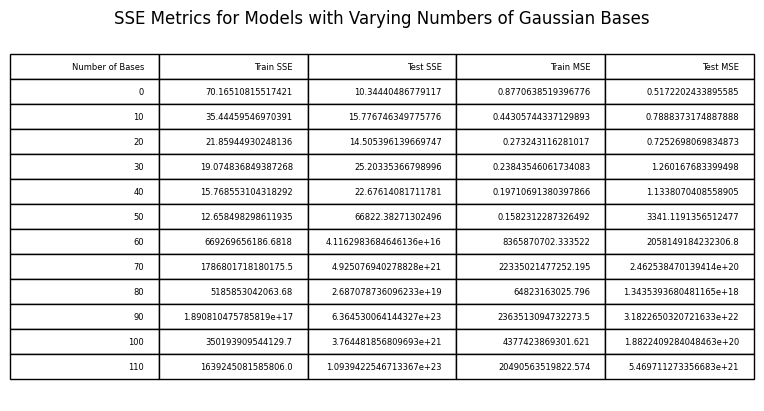

In [ ]:
table_list = [['Number of Bases', 'Train SSE', 'Test SSE', 'Train MSE', 'Test MSE']] #intitialize list for table

for D in range(0, 111, 10):
  if D == 0:
      # Train and evaluate linear model without Gaussian bases
    mu = np.linspace(0, 20, D)
    linear_model.fit(x_train, y_train)
    y_pred_train = linear_model.predict(x_train)
    y_pred_test = linear_model.predict(x_test)

  else:
    mu = np.linspace(0, 20, D)
    train_phi = gaussian(x_train[:, None], mu[None, :], sigma=1.0)
    test_phi = gaussian(x_test[:, None], mu[None, :], sigma=1.0)
    linear_model.fit(train_phi, y_train)
    y_pred_train = linear_model.predict(train_phi)
    y_pred_test = linear_model.predict(test_phi)

  sse_train = 0.5 * np.sum((y_train - y_pred_train) ** 2)
  sse_test = 0.5 * np.sum((y_test - y_pred_test) ** 2)
  table_list.append([D, sse_train, sse_test, sse_train/80, sse_test/20])

  print("\nSSE Metrics for model using", D, "Gaussian bases")
  print("Train SSE:", sse_train)
  print("Test SSE:", sse_test)
  print("Train MSE:", sse_train/80)
  print("Test MSE", sse_test/20)

fig,ax = plt.subplots()
ax.axis('off') #no graph just table
table = ax.table(cellText = table_list, loc = 'center')
table.scale(1.5, 1.5)
plt.title("SSE Metrics for Models with Varying Numbers of Gaussian Bases")
plt.show()

#### **1.5 - Explanation**

**Model Performance - Observations**

For models with lower amounts of Gaussian bases (0-50), we observe predictable trends in the model performance:
* As the number of bases increases, the model can more closely fit the training data. We therefore see consistently decreasing MSE values on the train set.
* As the number of bases increases, we run a higher risk of overfitting the training data. We can therefore see that although the _test_ SSE diminishes consistently for 0, 10, 20 bases (model approaches actual distribution), it starts climbing again for 30, 40, etc. bases (model overfits training data).
* We observe an equilibrium between underfitting and overfitting at the point where the test error is minimized.

For models with higher amounts of Gaussian bases (60+), we observe effects of overfitting and numerical instability. The latter is caused by having a large number of closely-spaced Gaussian transformations with narrow spreads (sigma = 1).
* This can result in the resulting design matrix becoming ill-conditioned (columns of matrix are highly correlated), leading to a matrix that is very difficult to invert.
* This ultimately leads to extremely large Gaussian bases being used and the model becoming unpredictable -> This explains the SSE values exploding after D > 50.



**Optimal Model Selection**
* The validation set helps us measure how each given model will perform on unseen data. Since the goal of our model is to make accurate predictions on new data, this is a metric we want to prioritize when selecting an optimal model.
* Our optimal model will be the one that minimizes validation set error, i.e. generalizes best to unseen data and reaches an equilibrium between overfitting and underfitting.
* For our dataset, this appears to be the model using <u>20 Gaussian bases</u>.

### **Task 2: Bias-Variance Tradeoff with Multiple Samples**

In this section, we will explore the tradeoff between bias and variance by repeating the the fitting process from Task 1 ten times to generate varying sample sets of data, so that we may analyze this tradeoff, as well as the transition from underfitting to overfitting as the level of complexity increases.

**This section will include the following subsections:**
* Multiple Sample: Data Generation and Model Fitting
* Performance Evaluation as Complexity Increases

#### **2.1 - Multiple Samples: Data Generation & Model Fitting**


**Data Generation**

First, we will generate 10 sample sets of 100 data points sampled from a non-linear function to simulate real-world noisy data.

In [ ]:
# Repeat data generation process from task 1 ten times:

samples = []                                  #array of 10 iterations

for i in range(10):
  # Generate Data
  xs, ys, yts = gen_data()                    #sample data like in t1

  # Initialize each model
  linear_model = LinearRegression()

  # Save parameters for each of the 10 iterations
  iteration = {
      'model': linear_model,
      'x_entries': xs,
      'y_entries': ys,
      'unbiased_y_entries': yts}

  samples.append(iteration)

**Model Fitting**

Now to fit the model using 10 different samples on varying levels of complexity (D= 0, 10, ..., 100)

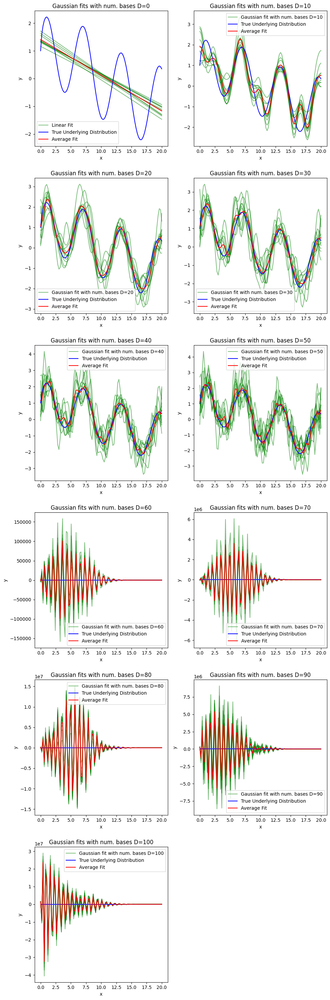

In [ ]:
# Define grid of subplots
fig_gaussian, axes_gaussian = plt.subplots(6, 2, figsize=(10, 30))
axes_gaussian = axes_gaussian.ravel()                     #flatten axes for easy iteration over plots


# Fit each of 10 models with varying amt of bases:
for i, D in enumerate(range(0, 101, 10)):

  predictions = []                                        #array of all 10 predictions

  # Perform linear regression without Gaussian bases (ie D=0)
  if D == 0:
    for j in range(0, 10):
        model = samples[j]['model']
        x_entries = samples[j]['x_entries']
        y_entries = samples[j]['y_entries']
        unbiased_y_entries = samples[j]['unbiased_y_entries']

        yh = model.fit(x_entries, y_entries).predict(x_entries) #fit model

        predictions.append(yh)
        if j==0:
          axes_gaussian[i].plot(x_entries, yh, 'g-', label='Linear Fit', alpha=0.5)
        else:
          axes_gaussian[i].plot(x_entries, yh, 'g-', alpha=0.5)

    # Plot Underlying Function (blue):
    axes_gaussian[i].plot(x_entries, unbiased_y_entries, 'b-', label='True Underlying Distribution')

    # Plot average of 10 fits:
    avg_predictions = np.mean(predictions, axis=0)
    axes_gaussian[i].plot(x_entries, avg_predictions, 'r-', label='Average Fit')

    axes_gaussian[i].set_xlabel('x')
    axes_gaussian[i].set_ylabel('y')
    axes_gaussian[i].legend()
    axes_gaussian[i].set_title(f"Gaussian fits with num. bases D={D}")
    continue


  # For D>0:
  for j in range(0, 10):
    model = samples[j]['model']
    x_entries = samples[j]['x_entries']
    y_entries = samples[j]['y_entries']
    unbiased_y_entries = samples[j]['unbiased_y_entries']

    # Fit and predict:
    yh = linear_model.fit(phis[i], y_entries).predict(phis[i])
    predictions.append(yh)
    if j == 0:
      axes_gaussian[i].plot(x_entries, yh, 'g-', label=f'Gaussian fit with num. bases D={D}', alpha=0.5)
    else:
      axes_gaussian[i].plot(x_entries, yh, 'g-', alpha=0.5)

  # Plot Underlying Function (blue):
  axes_gaussian[i].plot(x_entries, unbiased_y_entries, 'b-', label='True Underlying Distribution')

  # Plot average of 10 fits:
  avg_predictions = np.mean(predictions, axis=0)
  axes_gaussian[i].plot(x_entries, avg_predictions, 'r-', label='Average Fit')

  axes_gaussian[i].set_xlabel('x')
  axes_gaussian[i].set_ylabel('y')
  axes_gaussian[i].legend()
  axes_gaussian[i].set_title(f"Gaussian fits with num. bases D={D}")

axes_gaussian[-1].set_visible(False)            # Hide the 12th subplot
plt.tight_layout()                              # Adjust layout to avoid overlapping labels
plt.show()


**Visual Observations:**

We observe typical behavior of models as they transition from **underfitting to overfitting**:
- When no non-linear basis functions are applied to our data (D=0), we have a linear fit of our data which underfits the data significantly, resulting in high bias and but low variance.
- On the other hand, when D>50, we observe signs of overfitting with a high variance and low bias.
- Visually, we can conclude there is an optimal level of complexity between D=20 and D=40 where the model best fits the data.

To find that optimal level of complexity we must further analyze the training and test errors and regularize our model.

#### **2.2 - Explaining Bias & Variance: Training and Test Errors Comparison**

In this subsection we will compare the performance of the models, as measured by the Mean Squared Error (MSE), as we increase the number of Gaussian bases (D= 0,10,20,...,100) to increase the complexity of the model. First we must split the datasets into training and test sets. We will stick to a typical 80-20 split for now.

First we must split and shuffle the 10 samples:

In [ ]:
datasets = {
    'x_trains': [],
    'y_trains': [],
    'x_tests': [],
    'y_tests': [],
    'phis': []
}

# Split Data into train and test sets:
for i in range(10):
  # Get Data:
  x_entries = samples[i]['x_entries']
  y_entries = samples[i]['y_entries']

  # Combine features and targets:
  data = np.column_stack((x_entries, y_entries))    #combine so that they can be shuffled together

  # Shuffle Data:
  np.random.shuffle(data)

  # Separate data again:
  x_shuffled = data[:, 0]
  y_shuffled = data[:, 1]

  # Split into Train & Test sets:
  split_idx = int(0.8 * len(x_shuffled))
  x_train = x_shuffled[:split_idx]
  y_train = y_shuffled[:split_idx]

  x_test = x_shuffled[split_idx:]
  y_test = y_shuffled[split_idx:]

  #Store split sample sets:
  datasets['x_trains'].append(x_train)
  datasets['x_tests'].append(x_test)
  datasets['y_trains'].append(y_train)
  datasets['y_tests'].append(y_test)

Now, we can train and test the model on the 10 split sample sets:

In [ ]:
# Train & Test Models per level of complexity:
avg_train_errors = []                         #list of 11 train avgs
avg_test_errors = []                          #list of 11 test avgs

for j, D in enumerate(range(0, 101, 10)):
  train_errors_per_sample = []                #list of 10 train errors for that D
  test_errors_per_sample = []                 #list of 10 test errors for that D

  for i in range(0, 10):
    linear_model = LinearRegression()
    x_train = datasets['x_trains'][i]
    y_train = datasets['y_trains'][i]
    x_test = datasets['x_tests'][i]
    y_test = datasets['y_tests'][i]

    # Linear fit - D=0
    if D == 0:
      xTrain = x_train
      xTest = x_test

    # Gaussian Transformation - D>0
    elif D > 0:
      # Define mean values for the Gaussian functions
      mu = np.linspace(0, 20, D)

      # Recompute the Gaussian basis functions for this mu on curr x_sample
      xTrain = gaussian(x_train[:, None], mu[None, :], sigma=1.0)
      xTest = gaussian(x_test[:, None], mu[None, :], sigma=1.0)

    # Fit & Predict
    yh = linear_model.fit(xTrain, y_train)            #Fit model on training set
    y_pred_train = linear_model.predict(xTrain)      #predictions on train set
    y_pred_test = linear_model.predict(xTest)        #predictions on test set

    ## Calculate Metrics (SSEs):
    sse_train = 0.5 * np.sum((y_train - y_pred_train) ** 2)
    mse_train = sse_train / len(y_train)
    train_errors_per_sample.append(mse_train)

    sse_test = 0.5 * np.sum((y_test - y_pred_test) ** 2)
    mse_test = sse_test / len(y_test)
    test_errors_per_sample.append(mse_test)

  avg_traine_per_D = np.mean(train_errors_per_sample)
  avg_train_errors.append(avg_traine_per_D)

  avg_teste_per_D = np.mean(test_errors_per_sample)
  avg_test_errors.append(avg_teste_per_D)

Plotting the Results:

                           Avg. Train MSE Avg. Test MSE
Num. of Gaussian Bases (D)                             
0                                 0.94219       0.86594
10                                0.54259       0.57759
20                                0.33516       0.63924
30                                0.27453       0.73306
40                                0.22664        1.6042
50                                0.17745        5.8663
60                             4.2313e+10    1.1627e+15
70                             2.4585e+12    3.5897e+16
80                              8.299e+14    3.0177e+18
90                             1.7856e+15    3.2031e+21
100                            1.6972e+15    9.2263e+20


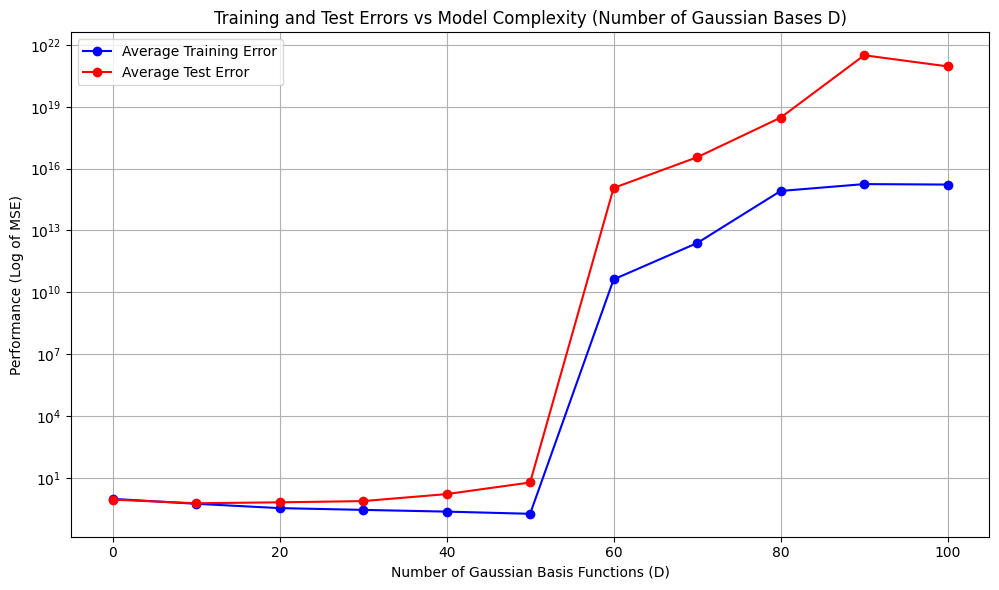

In [ ]:
# Results as Table
D_values = list(range(0, 101, 10))
error_table = pd.DataFrame({
    'Num. of Gaussian Bases (D)': D_values,
    'Avg. Train MSE': avg_train_errors,
    'Avg. Test MSE': avg_test_errors
})
error_table['Avg. Train MSE'] = error_table['Avg. Train MSE'].map(lambda x: f'{x:.5g}')
error_table['Avg. Test MSE'] = error_table['Avg. Test MSE'].map(lambda x: f'{x:.5g}')
error_table = error_table.set_index('Num. of Gaussian Bases (D)')
print(error_table)


# Plot Avg Performance:
plt.figure(figsize=(10, 6))
plt.plot(D_values, avg_train_errors, 'o-', label='Average Training Error', color='blue')
plt.plot(D_values, avg_test_errors, 'o-', label='Average Test Error', color='red')
plt.xlabel('Number of Gaussian Basis Functions (D)')
plt.ylabel('Performance (Log of MSE)')
plt.title('Training and Test Errors vs Model Complexity (Number of Gaussian Bases D)')
plt.legend()

# Show plot
plt.grid(True)
plt.tight_layout()
plt.yscale('log')
plt.show()

**Analysis of Bias & Variance Tradeoff**

Trends & Observations in the plot above:
  * Training Error:
    - **Initially**, the training error is **relatively high** (1.01) as expected, considering the model has no additional complexity (D=0) and tries to fit non-linear data with a linear fit. The model is therefore **underfitting**.
    - This is followed by a **steady decline**; as the model becomes more complex, the **bias decreases** and the model fits the data better.
    - However, around D=50, the model starts to **overfit** due to the increasing complexity, which causes **the variance to increase**.

  * Test Error:
    - The test error also **starts relatively high** (1.00), and decreases as the complexity increases - reaching its minimum around D=20, (0.80). After D=20, the test error starts to pick up, indicating that the model is starting to overfit the data and therefore **variance increases** as the model **generalizes less effectively on this new unseen data**.
    - Thus, in the range D={10,30}, there is a **transition from underfitting to overfitting (or from high bias-low variance to low bias-high variance)**, which means there is an optimal level of complexity somewhere in this range, that can be found using **cross-validation**.


### **Task 3: Regularization with Cross-Validation**

In this section, we will implement and apply both L1 (Lasso) and L2 (Ridge) regularization to a linear regression model, and use 10-fold cross-validation to determine the optimal regularization strength.

**This section will include the following subsections:**
* Adding Regularization to Linear Regression Model
* Cross-Validation
* Plotting Train and Test Errors
* Plotting Bias-Variance Decomposition

#### **3.1 - Adding Regularization to Linear Regression Model**

We will modify our existing implementation of our Linear Regression class to include 70 evenly-spaced Gaussian bases, L1 regularization and L2 regularization.

This will first involve implementing gradient descent as an optimization method.

In [ ]:
class StochasticGradientDescent:
    """
    Implementation for mini-batch stochastic gradient descent.
    """
    def __init__(self, lr=0.001, max_iters=1e4, epsilon=1e-4, batch_size=16, record_history=False, verbose=False):
        self.lr = lr                                    #learning rate
        self.max_iters = max_iters                      #maximum iterations
        self.epsilon = epsilon                          #convergence threshold
        self.batch_size = batch_size                    #batch size
        self.verbose = verbose                          #flag to print logs

        self.record_history = record_history            #flag to store weight history for visualization
        if record_history:
            self.history = []                           #store weight history


    def run(self, gradient_fn, x, y, w):
      N = x.shape[0]
      grad_norm = np.inf
      t = 1

      while grad_norm > self.epsilon and t < self.max_iters:
        # Shuffle the data at the start of each epoch (ie every full batch of data)
        indices = np.arange(N)
        np.random.shuffle(indices)
        x_shuffled = x[indices]
        y_shuffled = y[indices]

        # Iterate through mini-batches
        for start_idx in range(0, N, self.batch_size):
          end_idx = min(start_idx + self.batch_size, N)   #take min of batch size or remaining samples
          x_batch = x_shuffled[start_idx:end_idx]
          y_batch = y_shuffled[start_idx:end_idx]

          #compute gradient of batch
          grad = gradient_fn(x_batch, y_batch, w)


          #cur batch weight update
          w = w - self.lr * grad

          if self.record_history:
              self.history.append(w)

          #further stopping within current epoch
          grad_norm = np.linalg.norm(grad)                 #check grad norm for convergence
          if grad_norm < self.epsilon:
            break

        #one iteration done
        t += 1

      #Results
      if self.verbose:
        print(f"Final weights are: {w}. Terminated after {t} iterations.")

      return w

In [ ]:
class LinearRegressionRegularizedSGD(LinearRegression):
    """
    Imlementation of linear regression with Stochastic Gradient Descent
    as optimizer function and L1/L2 regularization.
    """
    def __init__(self, add_bias=True, lr=0.001, max_iters=1e4, epsilon=1e-8, batch_size=16, record_history=False, verbose=False, l1_reg=0, l2_reg=0):
      super().__init__(add_bias=add_bias)
      self.optimizer = StochasticGradientDescent(lr, max_iters=max_iters, epsilon=epsilon, batch_size=batch_size, record_history=record_history, verbose=verbose)
      self.l1_reg = l1_reg
      self.l2_reg = l2_reg


    def fit(self, x, y):
      if x.ndim == 1:
          x = x[:, None]

      if self.add_bias:                                        #add bias to features
          N = x.shape[0]
          x = np.column_stack([x,np.ones(N)])

      N,D = x.shape                                            #num of samples, num of features
      w0 = np.zeros(D)                                         #init weights to 0

      # define the gradient function
      def gradient_lin(x, y, w):
          yh =  x @ w
          N, D = x.shape
          grad = .5*np.dot(yh - y, x)/N
          grad += self.l1_reg * np.sign(w)  # Implement L1 regularization
          grad += self.l2_reg * w           # Implement L2 regularization
          return grad


      #Run mini-batch SGD
      self.w = self.optimizer.run(gradient_lin, x, y, w0)      # run the optimizer to get the optimal weights
      return self

We will now test the model with 70 Gaussian bases and varying levels of regularization, to ensure we are getting valid results.

In [ ]:
def train_and_fit_regularization(x_train, y_train, lr=0.01, max_iters=1e3, l1_reg=0, l2_reg=0, D=0):
  """
  Trains and fits a Linear Regression model with Regularization to
  the entire provided x_train and y_train sets.
  """

  # Init model with full-batch SGD
  model = LinearRegressionRegularizedSGD(lr=lr,max_iters=max_iters, batch_size=len(x_train), record_history = True, verbose = False, l1_reg = l1_reg, l2_reg = l2_reg)

  # Apply Gaussian Bases if needed
  xTrain = x_train
  if D > 0:
    mu = np.linspace(0, 20, D)  # Use D Gaussian bases (70 for task 3, 0 for task 4)
    xTrain = gaussian(x_train[:, None], mu[None, :], sigma=1.0)

  # Fit the model on the training set
  model.fit(xTrain, y_train)

  y_train_pred = model.predict(xTrain)

  return y_train_pred

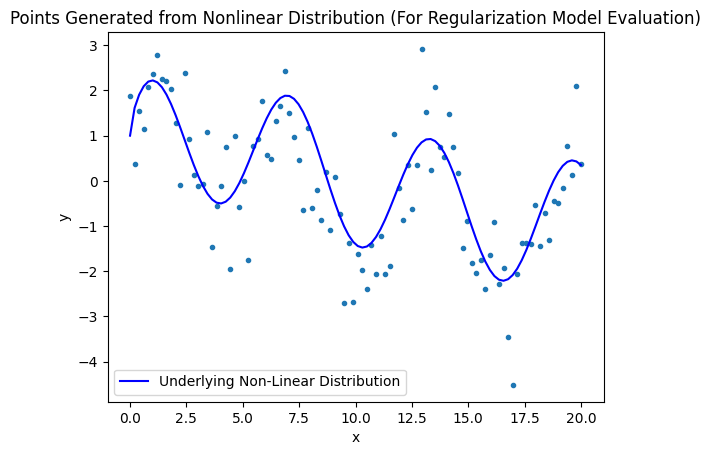

In [ ]:
# First, we will generate sample data from the same underlying distribution we have been using before
x_entries, y_entries, unbiased_y_entries = gen_data()

plt.plot(x_entries, y_entries, '.')
plt.plot(x_entries, unbiased_y_entries, 'b-', label='Underlying Non-Linear Distribution')
plt.title("Points Generated from Nonlinear Distribution (For Regularization Model Evaluation)")
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

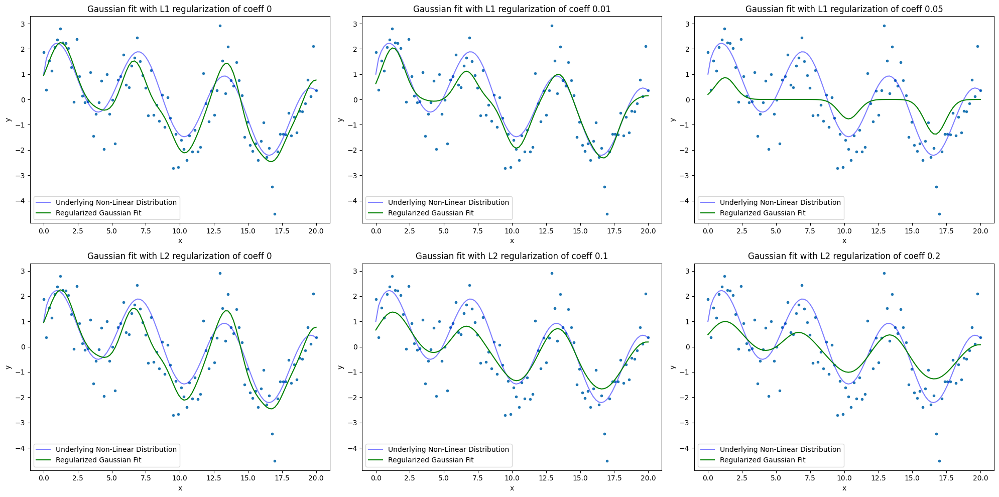

In [ ]:
# Test: Plot standard model with 3 levels of regularization for L1 and L2 regression.

# Define grid of subplots
fig_gaussian, axes_gaussian = plt.subplots(2, 3, figsize=(20, 10))
axes_gaussian = axes_gaussian.ravel() # Flatten axes for easy iteration
l1_regularization_levels = [0, 0.01, 0.05]
l2_regularization_levels = [0, 0.1, 0.2]
grid_i = 0

for i in range(len(l1_regularization_levels)):
  yh = train_and_fit_regularization(x_entries, y_entries, lr=0.01, max_iters = 10e3, l1_reg=l1_regularization_levels[i], l2_reg=0, D=70)
  axes_gaussian[grid_i].plot(x_entries, y_entries, '.')
  axes_gaussian[grid_i].plot(x_entries, unbiased_y_entries, 'b-', label='Underlying Non-Linear Distribution', alpha=0.5)
  axes_gaussian[grid_i].plot(x_entries, yh, 'g-', label="Regularized Gaussian Fit")
  axes_gaussian[grid_i].set_xlabel('x')
  axes_gaussian[grid_i].set_ylabel('y')
  axes_gaussian[grid_i].legend()
  axes_gaussian[grid_i].set_title(f"Gaussian fit with L1 regularization of coeff "+str(l1_regularization_levels[i]))
  grid_i += 1

for j in range(len(l2_regularization_levels)):
  yh = train_and_fit_regularization(x_entries, y_entries, lr=0.01, max_iters = 10e3, l1_reg=0, l2_reg=l2_regularization_levels[j], D=70)
  axes_gaussian[grid_i].plot(x_entries, y_entries, '.')
  axes_gaussian[grid_i].plot(x_entries, unbiased_y_entries, 'b-', label='Underlying Non-Linear Distribution', alpha=0.5)
  axes_gaussian[grid_i].plot(x_entries, yh, 'g-', label="Regularized Gaussian Fit")
  axes_gaussian[grid_i].set_xlabel('x')
  axes_gaussian[grid_i].set_ylabel('y')
  axes_gaussian[grid_i].legend()
  axes_gaussian[grid_i].set_title(f"Gaussian fit with L2 regularization of coeff "+str(l2_regularization_levels[j]))
  grid_i += 1

plt.tight_layout() # Adjust layout to avoid overlapping labels
plt.show()

We can see that our model successfully implements L1 and L2 regularization on our linear regression models.

#### **3.2 - Cross-Validation for Optimal Regularization Strength**

In this section, we will evaluate a range of regularization strengths for both L1 and L2 regularization. For each lambda value, we will:
* Split the training data into 10 subsets (folds)
* Train the model on 9 folds and validate on the remaining fold.
* Repeat this for each fold and compute the MSE on both training and validation sets.

In [ ]:
# From section 3.1, we can see that L1 regularization is more sensitive to
# higher lambda values and therefore should perform better with relatively smaller values.

l1_lambdas = [0, 0.0001, 0.001, 0.005, 0.01, 0.025, 0.05, 0.1]
l2_lambdas = [0, 0.001, 0.01, 0.05, 0.1, 0.25, 0.5, 1]

def shuffle_and_split(x, y, num_folds=10):
  """
  Shuffles our (x, y) (feature, target) data.
  Returns two arrays of length num-folds containing all folds, such that
  folds_x[i] corresponds to folds_y[i].
  """

  indices = np.arange(len(x))
  np.random.shuffle(indices)

  x_shuffled = x[indices]
  y_shuffled = y[indices]

  # Split into folds
  fold_size = len(x) // num_folds
  folds_x = [x_shuffled[i:i+fold_size] for i in range(0, len(x), fold_size)]
  folds_y = [y_shuffled[i:i+fold_size] for i in range(0, len(y), fold_size)]

  return folds_x, folds_y

# Split training data into 10 subsets
x_folds, y_folds = shuffle_and_split(x_entries, y_entries)

print("Number of feature subsets:", len(x_folds))
print("Number of target subsets:", len(y_folds))

Number of feature subsets: 10
Number of target subsets: 10


In [ ]:
def train_and_evaluate_regularization(x_train, y_train, x_test, y_test, lr=0.01, max_iters=1e3, l1_reg=0, l2_reg=0):
  """
  Trains and fits a Linear Regression model with Regularization to
  train and test sets, then returns metrics on them.
  """

  # Init model with fullb-batch SGD
  model = LinearRegressionRegularizedSGD(lr=lr,max_iters=max_iters, batch_size = len(x_train), record_history = True, verbose = False, l1_reg = l1_reg, l2_reg = l2_reg)
  mu = np.linspace(0, 20, 70) # Use 70 Gaussian bases

  train_phi = gaussian(x_train[:, None], mu[None, :], sigma=1.0)
  test_phi = gaussian(x_test[:, None], mu[None, :], sigma=1.0)

  # Fit the model on the training set
  model.fit(train_phi, y_train)

  y_train_pred = model.predict(train_phi)
  y_test_pred = model.predict(test_phi)

  # Calculate performance metrics (e.g., Mean Squared Error) for both sets
  train_mse = np.mean((y_train - y_train_pred) ** 2)
  test_mse = np.mean((y_test - y_test_pred) ** 2)

  return train_mse, test_mse

Now that we have defined helper functions to simplify the process, we will use 10-fold cross validation to evaluate our range of regularization strengths for L1 and L2 regularization.

* For each regularization strength lambda, the MSE for both training and validation sets will be computed as the mean MSE obtained over all 10 partitions of our train/test folds.

In [ ]:
print("### L1 Regularization Stats: ### \n")

for l1_lambda in l1_lambdas:
  train_mses = [] # Will store each of the 10 computed train MSEs
  test_mses = [] # Will store each of the 10 computed test MSEs

  for i in range(10):
    # Separate the ith fold as validation data
    x_val = x_folds[i]
    y_val = y_folds[i]

    x_train = np.concatenate([fold for j, fold in enumerate(x_folds) if j != i], axis=0)
    y_train = np.concatenate([fold for j, fold in enumerate(y_folds) if j != i], axis=0)

    curr_train_mse, curr_test_mse = train_and_evaluate_regularization(x_train, y_train, x_val, y_val, lr=0.01, max_iters = 10e3, l1_reg=l1_lambda, l2_reg=0)
    train_mses.append(curr_train_mse)
    test_mses.append(curr_test_mse)

  avg_train_mse = sum(train_mses)/len(train_mses)
  avg_test_mse = sum(test_mses)/len(test_mses)
  print("For L1 regularization value", l1_lambda, ", computed avg. train MSE of", avg_train_mse, "and average test MSE of", avg_test_mse)


print("\n\n### L2 Regularization Stats: ### \n")


for l2_lambda in l2_lambdas:
  train_mses = [] # Will store each of the 10 computed train MSEs
  test_mses = [] # Will store each of the 10 computed test MSEs

  for i in range(10):
    # Separate the ith fold as validation data
    x_val = x_folds[i]
    y_val = y_folds[i]

    x_train = np.concatenate([fold for j, fold in enumerate(x_folds) if j != i], axis=0)
    y_train = np.concatenate([fold for j, fold in enumerate(y_folds) if j != i], axis=0)

    curr_train_mse, curr_test_mse = train_and_evaluate_regularization(x_train, y_train, x_val, y_val, lr=0.01, max_iters = 10e3, l1_reg=0, l2_reg=l2_lambda)
    train_mses.append(curr_train_mse)
    test_mses.append(curr_test_mse)

  avg_train_mse = sum(train_mses)/len(train_mses)
  avg_test_mse = sum(test_mses)/len(test_mses)
  print("For L2 regularization value", l2_lambda, ", computed avg. train MSE of", avg_train_mse, "and average test MSE of", avg_test_mse)

### L1 Regularization Stats: ### 

For L1 regularization value 0 , computed avg. train MSE of 0.5523958926474435 and average test MSE of 0.8548909323659142
For L1 regularization value 0.0001 , computed avg. train MSE of 0.5526379672851476 and average test MSE of 0.8531046140321893
For L1 regularization value 0.001 , computed avg. train MSE of 0.5563045982506514 and average test MSE of 0.8369830304728186
For L1 regularization value 0.005 , computed avg. train MSE of 0.5851169798941038 and average test MSE of 0.8271648856512573
For L1 regularization value 0.01 , computed avg. train MSE of 0.6409452283682526 and average test MSE of 0.8445421156324407
For L1 regularization value 0.025 , computed avg. train MSE of 0.8833887920983668 and average test MSE of 1.0700890051790473
For L1 regularization value 0.05 , computed avg. train MSE of 1.4556708303925396 and average test MSE of 1.6677449502435315
For L1 regularization value 0.1 , computed avg. train MSE of 2.3051200944917207 and average tes

#### **3.3 - Plotting Train and Test Errors**

In this section, we will plot the train and test error as a function of lambda. We will use the folloing parameter settings:
* Lambda range: np.logspace(-4, 2, 15)
* Num. Gaussian Bases = 70
* Noise variance = 1.0
* Num. Folds = 10

In [ ]:
# Define our range of lambdas
graph_lambdas = np.logspace(-4, 2, 15)
print("Lambdas:", graph_lambdas)

graph_gaussian_bases, num_folds = 70, 10

# Define arrays to hold results
l1_train_mses = []
l1_test_mses = []
l2_train_mses = []
l2_test_mses = []

Lambdas: [1.00000000e-04 2.68269580e-04 7.19685673e-04 1.93069773e-03
 5.17947468e-03 1.38949549e-02 3.72759372e-02 1.00000000e-01
 2.68269580e-01 7.19685673e-01 1.93069773e+00 5.17947468e+00
 1.38949549e+01 3.72759372e+01 1.00000000e+02]


In [ ]:
x_folds, y_folds = shuffle_and_split(x_entries, y_entries) # Split data into 10 randomized slices

print("Evaluating results for L1 regularization...")
for l1_lambda in graph_lambdas:
  train_mses = [] # Will store each of the 10 computed train MSEs
  test_mses = [] # Will store each of the 10 computed test MSEs

  for i in range(10):
    # Separate the ith fold as validation data
    x_val = x_folds[i]
    y_val = y_folds[i]

    x_train = np.concatenate([fold for j, fold in enumerate(x_folds) if j != i], axis=0)
    y_train = np.concatenate([fold for j, fold in enumerate(y_folds) if j != i], axis=0)

    curr_train_mse, curr_test_mse = train_and_evaluate_regularization(x_train, y_train, x_val, y_val, lr=0.01, max_iters = 10e3, l1_reg=l1_lambda, l2_reg=0)
    train_mses.append(curr_train_mse)
    test_mses.append(curr_test_mse)

  avg_train_mse = sum(train_mses)/len(train_mses)
  avg_test_mse = sum(test_mses)/len(test_mses)
  l1_train_mses.append(avg_train_mse)
  l1_test_mses.append(avg_test_mse)

print("Evaluating results for L2 regularization...")

for l2_lambda in graph_lambdas:
  train_mses = [] # Will store each of the 10 computed train MSEs
  test_mses = [] # Will store each of the 10 computed test MSEs

  for i in range(10):
    # Separate the ith fold as validation data
    x_val = x_folds[i]
    y_val = y_folds[i]

    x_train = np.concatenate([fold for j, fold in enumerate(x_folds) if j != i], axis=0)
    y_train = np.concatenate([fold for j, fold in enumerate(y_folds) if j != i], axis=0)

    curr_train_mse, curr_test_mse = train_and_evaluate_regularization(x_train, y_train, x_val, y_val, lr=0.01, max_iters = 10e3, l1_reg=0, l2_reg=l2_lambda)
    train_mses.append(curr_train_mse)
    test_mses.append(curr_test_mse)

  avg_train_mse = sum(train_mses)/len(train_mses)
  avg_test_mse = sum(test_mses)/len(test_mses)
  l2_train_mses.append(avg_train_mse)
  l2_test_mses.append(avg_test_mse)

print(l1_train_mses)
print(l1_test_mses)
print(l2_train_mses)
print(l2_test_mses)

Evaluating results for L1 regularization...
Evaluating results for L2 regularization...
[0.5526804788981965, 0.5531697631105663, 0.5549530969370637, 0.5615272700471207, 0.5863044413101347, 0.697566122239105, 1.1544751957837112, 2.3000230561846786, 2.322380728847418, 2.3207672740909393, 2.325028460471414, 2.3157825400632275, 2.402098648094757, 2.6093551419626726, 3.89213362451529]
[0.8461496198723687, 0.8439641415420315, 0.8383890206536797, 0.8319203022323244, 0.8265267988714052, 0.8847306004832491, 1.362560962847104, 2.321287296489277, 2.3225957088444074, 2.323199901839488, 2.324108171877308, 2.300238509627837, 2.3213846228584694, 2.4471190624127384, 4.023851715859811]
[0.5525734041716928, 0.5527958691619277, 0.5534057739091699, 0.5551308992958839, 0.5603123824689811, 0.5771002971194731, 0.6338890769318521, 0.8125060560199474, 1.2020560102864144, 1.6797551414512744, 2.026290060211905, 2.2043463240937404, 2.2806357421664996, 2.310716064209932, 2.322174524578091]
[0.846966934111034, 0.84

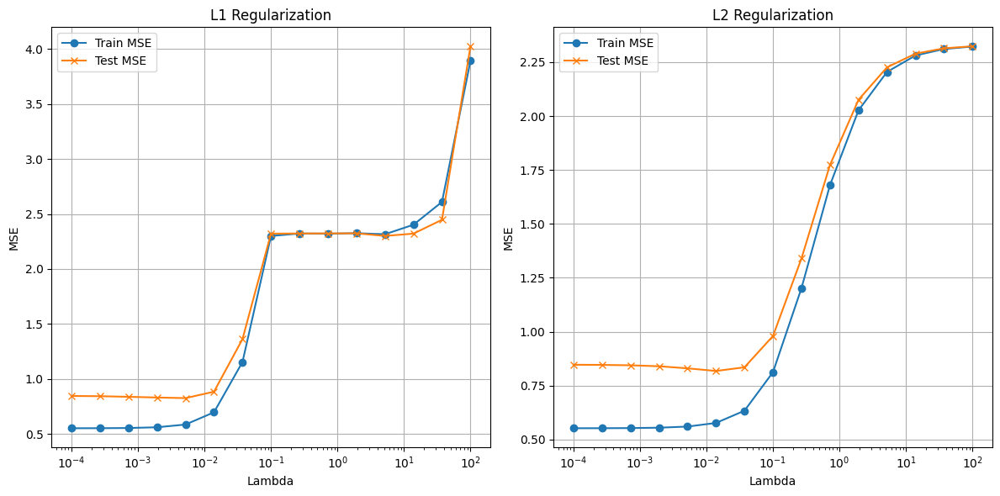

In [ ]:
fig_lambdas, axes_lambdas = plt.subplots(1, 2, figsize=(12, 6)) # Define plots

axes_lambdas[0].plot(graph_lambdas, l1_train_mses, label='Train MSE', marker='o')
axes_lambdas[0].plot(graph_lambdas, l1_test_mses, label='Test MSE', marker='x')
axes_lambdas[0].set_xscale('log')  # Set x-axis to logarithmic scale
axes_lambdas[0].set_xlabel('Lambda')
axes_lambdas[0].set_ylabel('MSE')
axes_lambdas[0].set_title('L1 Regularization')
axes_lambdas[0].legend()
axes_lambdas[0].grid(True)

# Plot for L2 Regularization
axes_lambdas[1].plot(graph_lambdas, l2_train_mses, label='Train MSE', marker='o')
axes_lambdas[1].plot(graph_lambdas, l2_test_mses, label='Test MSE', marker='x')
axes_lambdas[1].set_xscale('log')  # Set x-axis to logarithmic scale
axes_lambdas[1].set_xlabel('Lambda')
axes_lambdas[1].set_ylabel('MSE')
axes_lambdas[1].set_title('L2 Regularization')
axes_lambdas[1].legend()
axes_lambdas[1].grid(True)

# Adjust layout for better spacing
plt.tight_layout()

# Display the plots
plt.show()

These graphs plot L1 and L2 regularization MSEs against the same sets of lambda values.

**Behaviour - L1 Regularization:** Since L1 regularization performs feature selection (i.e. diminishes some feature weights all the way to zero), we can observe some interesting behaviours in the MSE trends:
* We see large jumps in both training and test error around lambda = 10^-1 and = 10^2, presumably at the points where the model sets a new feature's weight to zero.

**Observations:**
* L1 regularization performs better at relatively lower lambda values as compared to L1. We reach a minimum in L1 test MSE at around lambda = 10^-2.2, whereas L2 test MSE reaches a minimum at around lambda = 10^-1.5.
* The train/test MSEs for L2 regularization behave more predictably and consistently relative to a change in lambda. This is due to the fact that L2 regularization does not perform feature selection and instead scales feature weights down proportionally.

#### **3.4 - Plotting Bias-Variance Decomposition**

In this section, we will compute and plot the following metrics for both L1 and L2 regularization:

* Bias Squared
* Variance
* Bias Squared + Variance
* Bias Squared + Variance + Noise_Variance
* Test Error

These will be computed based on models sampled from 50 different datasets, each with N=40 evenly-spaced data points generated with noise and within the x-range [0, 20].

These models will maintain the following constant configurations:
* Gaussian Bases = 70
* Max. Iterations = 10e3
* Batch Size = Full-Batch
* 15 different lambda values on a logarithmic scale

_Note: As observed in part 3.3, L1 regularization is more sensitive to higher lambda values. To observe more accurate trends in Bias^2 and variance, we will choose a smaller-magnitude range of lambdas to measure it on. L2 regularization will continue to be measured with np.logspace(-4, 2, 15), while L1 regularization will be using np.logspace(-5, 1, 15)._


**Computing our Bias Squared and Variance Metrics**

* **Bias:** Measures how far off a model's average predictions are from the true values of the underlying function we're trying to predict.

* **Variance:** The variability of a model's predictions when training on different datasets sampled from the same underlying distribution.


To compute these, we will:
1. Generate 50 datasets, each containing N=40 evenly-spaced points in the range [0, 20] according to the underlying distribution function y = sin(sqrt(x)) + cos(x) + sin(x) + noise (such that the noise term has mean 0 and variance 1).

2. For each type of regularization...
  3. For each lambda value...
    4. Train an instance of our model (with given lambda value for given regularization, as well as all other constant inputs)
    5. Make predictions on the same set of evenly-spaced x entries in [0, 20] (according to our Gaussian distribution with D = 70).
    6. Use these predictions to compoute our Bias, Variance and Error metrics.
    


In [ ]:
def gen_data(num_points):
  x_entries = np.linspace(0, 20, num_points)
  unbiased_y_entries = np.sin(np.sqrt(x_entries)) + np.cos(x_entries) + np.sin(x_entries) # Nonlinear distribution funciton
  y_entries = unbiased_y_entries + np.random.randn(num_points)

  return x_entries, y_entries, unbiased_y_entries

generated_datasets = []
underlying_dist = []

mu = np.linspace(0, 20, 70) # Use 70 Gaussian bases
x_phi = []

for i in range(50):
  x_entries, y_entries, unbiased_y_entries = gen_data(40)
  generated_datasets.append((x_entries, y_entries))
  if i == 0:
    # Only set these once as they will be identical between datasets.
    underlying_dist = unbiased_y_entries
    x_phi = gaussian(x_entries[:, None], mu[None, :], sigma=1.0)

# generated_datasets now holds all 50 of our randomly sampled datasets of size 40 from our underlying distribution.
print(underlying_dist)

# We will use the same set of lambda values for this task
bv_lambdas_l1 = np.logspace(-5, 1, 15)
bv_lambdas_l2 = np.logspace(-4, 2, 15)

print(bv_lambdas_l1)
print(bv_lambdas_l2)


[ 1.          2.01845986  2.22188328  1.97770319  1.41497557  0.70762262
  0.0499588  -0.38653729 -0.49407169 -0.25434734  0.25799835  0.89550212
  1.47649449  1.83236937  1.85138651  1.50776534  0.86860362  0.07685367
 -0.68525477 -1.24292803 -1.47363498 -1.3385098  -0.8922489  -0.26895293
  0.35244562  0.79427662  0.92589108  0.69731327  0.1521297  -0.58370027
 -1.33423248 -1.9187915  -2.19844652 -2.11175215 -1.69055848 -1.05182247
 -0.36752699  0.17955383  0.44286308  0.34974951]
[1.00000000e-05 2.68269580e-05 7.19685673e-05 1.93069773e-04
 5.17947468e-04 1.38949549e-03 3.72759372e-03 1.00000000e-02
 2.68269580e-02 7.19685673e-02 1.93069773e-01 5.17947468e-01
 1.38949549e+00 3.72759372e+00 1.00000000e+01]
[1.00000000e-04 2.68269580e-04 7.19685673e-04 1.93069773e-03
 5.17947468e-03 1.38949549e-02 3.72759372e-02 1.00000000e-01
 2.68269580e-01 7.19685673e-01 1.93069773e+00 5.17947468e+00
 1.38949549e+01 3.72759372e+01 1.00000000e+02]


In [ ]:
# Compute results for L1 regularization

# Define arrays to hold results
bias_squared_l1 = []
variance_l1 = []
test_error_l1 = []

print("Computing data for L1 regularization...")
for l1_lambda in bv_lambdas_l1:

  print("Computing data for L1 regularization with regularization value", l1_lambda, "...")
  reg_model_predictions = [] # Store y predictions for each dataset model
  dataset_test_errors = [] # Store test error for each dataset

  for (x_entry, y_entry) in generated_datasets:
    # Train a model using the randomly sampled datasets (This function uses 70 Gaussian bases by default)
    model = LinearRegressionRegularizedSGD(lr=0.01,max_iters=10e3, batch_size = len(x_entry), record_history = True, verbose = False, l1_reg = l1_lambda, l2_reg = 0)
    model.fit(x_phi, y_entry) # Use this specific noisy dataset sample for training

    predictions = model.predict(x_phi)
    reg_model_predictions.append(predictions)

    dataset_test_error = np.mean((predictions - y_entry) ** 2)
    dataset_test_errors.append(dataset_test_error)

  mean_predictions = np.mean(reg_model_predictions, axis=0)  # Average prediction for each point across datasets
  curr_bias_squared = np.mean((mean_predictions - unbiased_y_entries) ** 2) # Calculate bias squared value
  bias_squared_l1.append(curr_bias_squared)

  curr_variance = np.mean(np.var(reg_model_predictions, axis=0))
  variance_l1.append(curr_variance)

  # Calculate test error using MSE
  curr_test_error = np.mean(dataset_test_errors)
  test_error_l1.append(curr_test_error)


Computing data for L1 regularization...
Computing data for L1 regularization with regularization value 1e-05 ...
Computing data for L1 regularization with regularization value 2.6826957952797274e-05 ...
Computing data for L1 regularization with regularization value 7.196856730011514e-05 ...
Computing data for L1 regularization with regularization value 0.00019306977288832496 ...
Computing data for L1 regularization with regularization value 0.0005179474679231213 ...
Computing data for L1 regularization with regularization value 0.0013894954943731374 ...
Computing data for L1 regularization with regularization value 0.003727593720314938 ...
Computing data for L1 regularization with regularization value 0.01 ...
Computing data for L1 regularization with regularization value 0.026826957952797246 ...
Computing data for L1 regularization with regularization value 0.07196856730011514 ...
Computing data for L1 regularization with regularization value 0.19306977288832497 ...
Computing data for

In [ ]:
# Compute results for L2 regularization

# Define arrays to hold results
bias_squared_l2 = []
variance_l2 = []
test_error_l2 = []

print("Computing data for L2 regularization...")
for l2_lambda in bv_lambdas_l2:

  print("Computing data for L2 regularization with regularization value", l2_lambda, "...")
  reg_model_predictions = [] # Store y predictions for each dataset model
  dataset_test_errors = [] # Store test error for each dataset

  for (x_entry, y_entry) in generated_datasets:
    # Train a model using the randomly sampled datasets (This function uses 70 Gaussian bases by default)
    model = LinearRegressionRegularizedSGD(lr=0.01,max_iters=10e3, batch_size = len(x_entry), record_history = True, verbose = False, l1_reg = 0, l2_reg = l2_lambda)
    model.fit(x_phi, y_entry) # Use this specific noisy dataset sample for training

    predictions = model.predict(x_phi)
    reg_model_predictions.append(predictions)

    dataset_test_error = np.mean((predictions - y_entry) ** 2)
    dataset_test_errors.append(dataset_test_error)

  mean_predictions = np.mean(reg_model_predictions, axis=0)  # Average prediction for each point across datasets
  curr_bias_squared = np.mean((mean_predictions - unbiased_y_entries) ** 2) # Calculate bias squared value
  bias_squared_l2.append(curr_bias_squared)

  curr_variance = np.mean(np.var(reg_model_predictions, axis=0))
  variance_l2.append(curr_variance)

  # Calculate test error using MSE
  curr_test_error = np.mean(dataset_test_errors)
  test_error_l2.append(curr_test_error)

Computing data for L2 regularization...
Computing data for L2 regularization with regularization value 0.0001 ...
Computing data for L2 regularization with regularization value 0.00026826957952797245 ...
Computing data for L2 regularization with regularization value 0.0007196856730011522 ...
Computing data for L2 regularization with regularization value 0.0019306977288832496 ...
Computing data for L2 regularization with regularization value 0.005179474679231213 ...
Computing data for L2 regularization with regularization value 0.013894954943731374 ...
Computing data for L2 regularization with regularization value 0.03727593720314938 ...
Computing data for L2 regularization with regularization value 0.1 ...
Computing data for L2 regularization with regularization value 0.2682695795279725 ...
Computing data for L2 regularization with regularization value 0.7196856730011514 ...
Computing data for L2 regularization with regularization value 1.9306977288832496 ...
Computing data for L2 regu

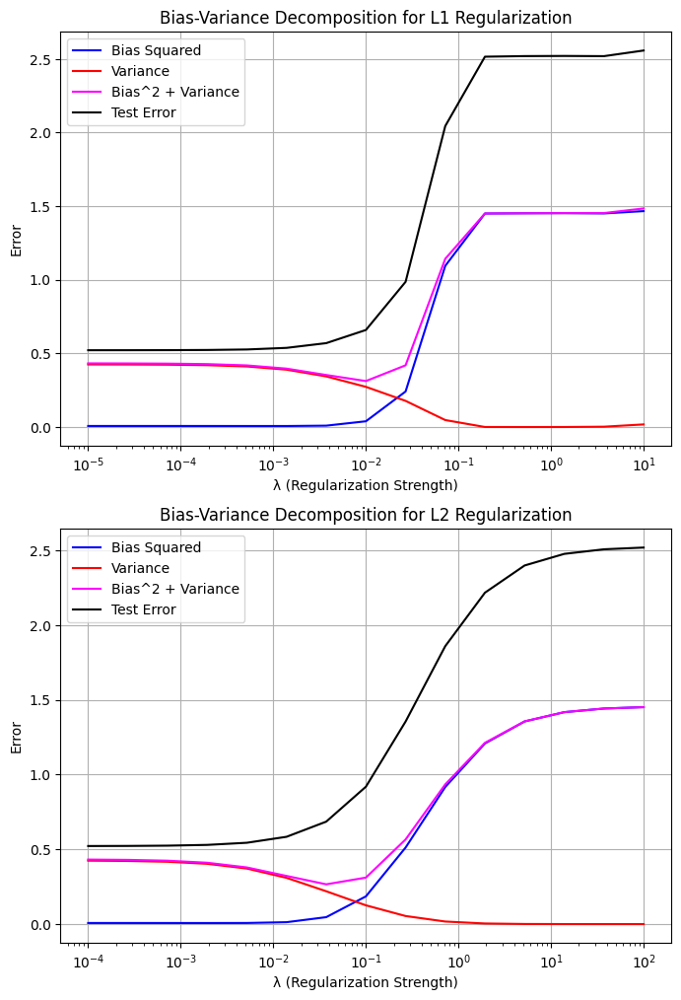

In [ ]:
# We can now plot our results for each dataset

fig_lambdas, axes_lambdas = plt.subplots(2, 1, figsize=(8, 12)) # Define plots

axes_lambdas[0].plot(bv_lambdas_l1, bias_squared_l1, label="Bias Squared", color="blue")
axes_lambdas[0].plot(bv_lambdas_l1, variance_l1, label="Variance", color="red")
axes_lambdas[0].plot(bv_lambdas_l1, np.array(bias_squared_l1) + np.array(variance_l1), label="Bias^2 + Variance", color="magenta")
axes_lambdas[0].plot(bv_lambdas_l1, test_error_l1, label="Test Error", color="black")
axes_lambdas[0].set_xscale('log')  # Set x-axis to logarithmic scale
axes_lambdas[0].set_xlabel('λ (Regularization Strength)')
axes_lambdas[0].set_ylabel('Error')
axes_lambdas[0].set_title('Bias-Variance Decomposition for L1 Regularization')
axes_lambdas[0].legend()
axes_lambdas[0].grid(True)

axes_lambdas[1].plot(bv_lambdas_l2, bias_squared_l2, label="Bias Squared", color="blue")
axes_lambdas[1].plot(bv_lambdas_l2, variance_l2, label="Variance", color="red")
axes_lambdas[1].plot(bv_lambdas_l2, np.array(bias_squared_l2) + np.array(variance_l2), label="Bias^2 + Variance", color="magenta")
axes_lambdas[1].plot(bv_lambdas_l2, test_error_l2, label="Test Error", color="black")
axes_lambdas[1].set_xscale('log')  # Set x-axis to logarithmic scale
axes_lambdas[1].set_xlabel('λ (Regularization Strength)')
axes_lambdas[1].set_ylabel('Error')
axes_lambdas[1].set_title('Bias-Variance Decomposition for L2 Regularization')
axes_lambdas[1].legend()
axes_lambdas[1].grid(True)

#### **3.5 - Selecting Optimal Lambda Value**

**Optimal Lambda:** For each type of regularization, the optimal lambda is defined as the one that minimizes the test MSE, i.e. the lambda value that produces a model that performs best on unseen data (and is closest to the actual underlying distribution). To find these optimal lambda values, we can refer to the train and test error vs. lambda graphs produced in part 3.3.

* L1 Regularization - Optimal Lambda: Our graph reaches a minimal value for test MSE at lambda = 5.17947468e-03.
* L2 Regularization - Optimal Lambda: Our graph reaches a minimal value for test MSE at lamba = 1.38949549e-02.


**Discussion - Regularization vs. Bias and Variance:** Our graphs plotting the Bias-Variance decomposition as a function of regularization values provide many insights on the effect of regularization (L1 and L2) on a model's ability to generalize.
* **Bias-Squared Trend:** Bias refers to the difference between the model's predicted output and the true output on average. As regularization increases (higher lambda values), the bias-squared value goes up. This is because the model gets increasingly simple as we increase regularization, and deviates more and more from the true underlying distribution.
* **Variance Trend:** Variance measures the sensitivity of the model to small fluctuations in the training data. A higher variance value can mean overfitting, since it indicates that a model's predictions change significantly when trained on different datasets. We observe this trend in the graphs, since as regularization increases, the variance value lowers. This indicates that as we increase regularization, the model overfits less and less, and it adjusts less and less to small fluctuations in the training data (performs more similarly on unseen data).
* **Bias Squared + Variance vs. Test Error:** Notice that the (bias squared + variance) graph is the exact same as the test error graph minus a value of 1 (i.e. the variance of the noise that was added to each data sample). This is a good example of Bias-Variance Decomposition, which cites that Test Error = Bias^2 + Variance + (Noise Error).
* **Comparision of Bias-Variance Decomposition Graphs - L1 vs. L2 Regularization:** Although the Bias-Variance decomposition graphs for L1 and L2 regularization behave similarly, there are some minor differences between them. One example is the fact that the trends in L1 regularization seem to be more "compressed" than those in L2 regularization. This is due to the fact that L1 regularization is more sensitive to fluctuations in lambda values, since higher regularization values can completely exclude some features. (Feature selection)

### **Task 4: Effect of L1 and L2 Regularization on Loss**

In the previous section (Task 3), we implemented a **LinearRegressionRegularizedSGD class** to apply our two regularization methods (L1 & L2) and explore cross-validation to find the optimal regularization strength ($\lambda$).

**In this section** we will reimplement this class on a new set of data - one that follows a linear relationship to the Gaussian Distribution - to compare the two methods of regularization, test out various levels of regularization strength and their effects on the overall loss function. This section will include the following steps:
- Data Generation
- Applying L1 & L2 Regularization
- Plotting the Loss Function
- gradien

#### **4.1 - Data Generation**
First, we will generate synthetic data (50 data points that are $x$ uniformly distributed between 0 and 10) using the following function that follows a linear relationship with Gaussian noise:
$$ y = -4x + 10 + 2\epsilon $$

where $\epsilon$ is Gaussian noise with a mean of 0 and variance of 1.

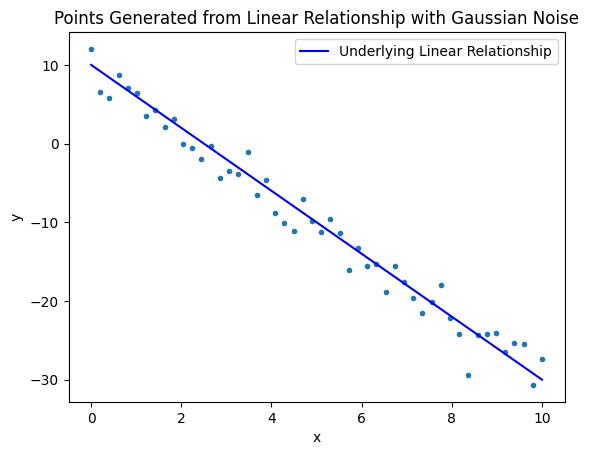

In [ ]:
# Define Data Generation Function:
def gen_data2():
  num_points = 50
  x_entries = np.linspace(0, 10, num_points)
  unbiased_y_entries =  -4 * x_entries + 10           #linear fct that follows Gaussian noise
  epsilon = np.random.randn(num_points)               #Gaussian Noise
  y_entries = unbiased_y_entries + 2 * epsilon        #y = -4x + 10 + 2 * epsilon

  return x_entries, y_entries, unbiased_y_entries

# Get Data:
x_entries, y_entries, unbiased_y_entries = gen_data2()

# Plot Synthetic Data:
plt.plot(x_entries, y_entries, '.')
plt.plot(x_entries, unbiased_y_entries, 'b-', label='Underlying Linear Relationship')
plt.title("Points Generated from Linear Relationship with Gaussian Noise")
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.show()

#### **4.2 - Applying L1 & L2 Regularization**

In this subsection we can fit and apply our two Regularization methods (L1 & L2)to our Gradient Descent Linear Regression model on our new dataset. To achieve this, we can call upon our already implemented **LinearRegressionRegularizedSGD class** and our **train_and_fit_regularization()** function on different levels of $\lambda$:

**Applying Lasso Regularization (L1):**

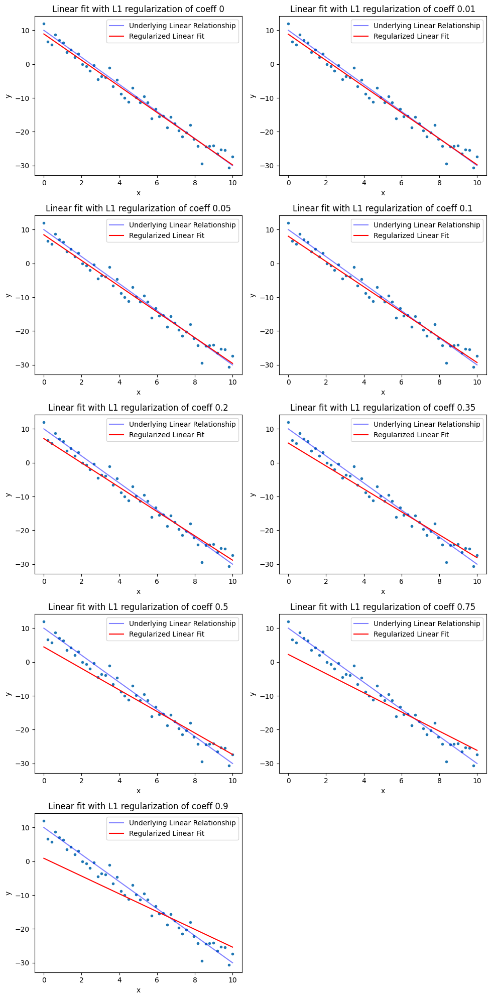

In [ ]:
# Define grid of subplots - standard model with 9 levels of regularization for L1
fig, axes = plt.subplots(5, 2, figsize=(10, 20))
axes = axes.ravel()                                                             # Flatten axes for easy iteration
l1_regularization_levels = [0, 0.01, 0.05, 0.1, 0.2, 0.35, 0.5, 0.75, 0.9]
grid_i = 0

# Iterate through values of lambda
for i in range(len(l1_regularization_levels)):
  # Fit:
  yh = train_and_fit_regularization(x_entries, y_entries, lr=0.01, max_iters = 10e3, l1_reg=l1_regularization_levels[i], l2_reg=0, D=0)

  # Plot:
  axes[grid_i].plot(x_entries, y_entries, '.')
  axes[grid_i].plot(x_entries, unbiased_y_entries, 'b-', label='Underlying Linear Relationship', alpha=0.5)
  axes[grid_i].plot(x_entries, yh, 'r-', label="Regularized Linear Fit")
  axes[grid_i].set_xlabel('x')
  axes[grid_i].set_ylabel('y')
  axes[grid_i].legend()
  axes[grid_i].set_title(f"Linear fit with L1 regularization of coeff "+str(l1_regularization_levels[i]))
  grid_i += 1

# Show Plot:
plt.tight_layout()                                                              # Adjust layout to avoid overlapping labels
axes[-1].set_visible(False)                                            # Hide the 10th subplot
plt.show()

**Applying Ridge Regularization (L2):**

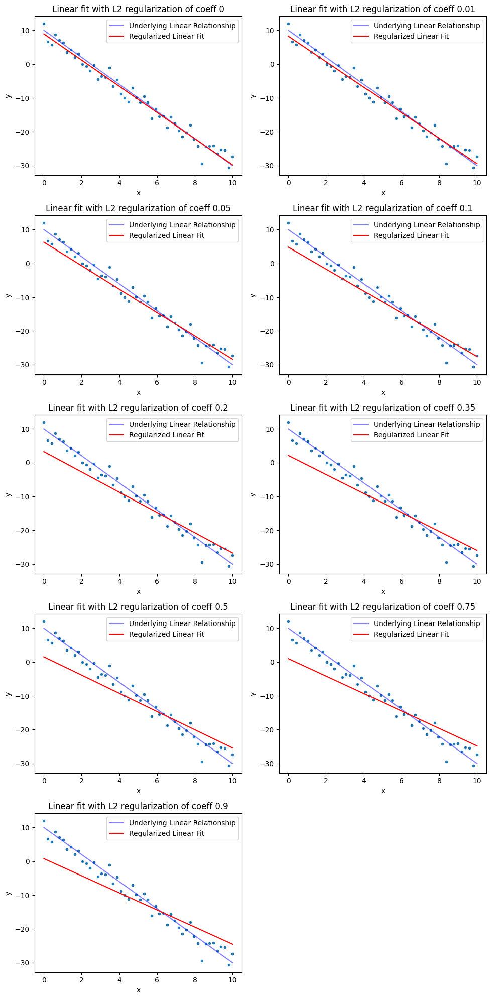

In [ ]:
# Define grid of subplots - standard model with 9 levels of regularization for L2 regression.
fig_gaussian, axes_gaussian = plt.subplots(5, 2, figsize=(10, 20))
axes_gaussian = axes_gaussian.ravel() # Flatten axes for easy iteration
l2_regularization_levels = [0, 0.01, 0.05, 0.1, 0.2, 0.35, 0.5, 0.75, 0.9]
grid_i = 0

# Iterate through values of lambda
for j in range(len(l2_regularization_levels)):
  #Fit:
  yh = train_and_fit_regularization(x_entries, y_entries, lr=0.01, max_iters = 10e3, l1_reg=0, l2_reg=l2_regularization_levels[j], D=0)

  #Plot:
  axes_gaussian[grid_i].plot(x_entries, y_entries, '.')
  axes_gaussian[grid_i].plot(x_entries, unbiased_y_entries, 'b-', label='Underlying Linear Relationship', alpha=0.5)
  axes_gaussian[grid_i].plot(x_entries, yh, 'r-', label="Regularized Linear Fit")
  axes_gaussian[grid_i].set_xlabel('x')
  axes_gaussian[grid_i].set_ylabel('y')
  axes_gaussian[grid_i].legend()
  axes_gaussian[grid_i].set_title(f"Linear fit with L2 regularization of coeff "+str(l2_regularization_levels[j]))
  grid_i += 1

# Show Plot:
plt.tight_layout()                                                              # Adjust layout to avoid overlapping labels
axes_gaussian[-1].set_visible(False)                                            # Hide the 10th subplot
plt.show()

**Visual Observations**

* **L1 Regularization (Lasso)**:
  - At lower levels of regularization strength ($\lambda$), the linear fit is relatively close to the true underlying function
  - **As $\lambda$ increases**, higher weights are penalized. The weights shrink, resulting in an **increasingly sparse model**. As a result, the predicted fit deviates from the underlying function.
  - The model essentially becomes less flexible with lower coefficients (and less parameters overall) **causing the model to underfit the data**.

* **L2 Regularization (Ridge)**:
  - Similarly, at lower levels of $\lambda$, the linear fit aligns almost perfectly with the underlying function, (signs of overfitting).
  - As $\lambda$ increases, regularization penalizes the sum of squared weights (thereby penalizing larger weights) and so the fit pivots clockwise again, just like in L1 regularization.
  - However, unlike L1 regularization, **L2 does not promote sparsity** in the model, and so the **weights are diminished more smoothly**, resulting in a **flatter slope**, and slightly less drastic underfitting.

#### **4.3 Effects of L1 & L2 on Loss Function**



First we must define our cost function (i.e. MSE for Linear Regression): without regularization, then with L1 Regularization, finally with L2 Regularization:

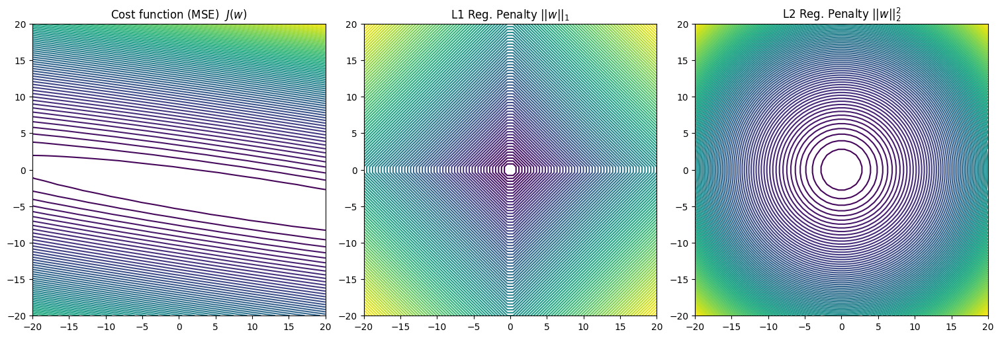

In [ ]:
# Defining our Cost Functions:
l1_penalty = lambda w: np.sum(np.abs(w))                                        # L1 penalty
l2_penalty = lambda w: np.dot(w,w) / 2                                          # L2 penalty

cost = lambda w: 0.5 * np.mean((w[0] + w[1] * x_entries - y_entries)**2)        # Cost Function without Regularization (i.e. MSE), w0-bias, w1-features
cost_plus_l1 = lambda w, l: cost(w) + l * l1_penalty(w)                         # Cost fct with L1: takes weights and l (reg strength) as inputs
cost_plus_l2 = lambda w, l: cost(w) + l * l2_penalty(w)                         # Cost fct with L2: takes weights and l (reg strength) as inputs


# Defining our Contour Plotting Function:
def plot_contour(f, x1bound, x2bound, resolution, ax, l=-1):
    x1range = np.linspace(x1bound[0], x1bound[1], resolution)
    x2range = np.linspace(x2bound[0], x2bound[1], resolution)
    xg, yg = np.meshgrid(x1range, x2range)
    zg = np.zeros_like(xg)
    for i,j in itertools.product(range(resolution), range(resolution)):
        if l < 0:
          zg[i,j] = f([xg[i,j], yg[i,j]])
        else:
          zg[i,j] = f([xg[i,j], yg[i,j]], l)

    ax.contour(xg, yg, zg, 100)
    return ax


# Plotting our Cost Function, L1 Reg. Penalty, L2 Reg. Penalty
fig, axes = plt.subplots(ncols=3, nrows=1, constrained_layout=True, figsize=(15, 5))

  #Cost function
plot_contour(cost, [-20,20], [-20,20], 50, axes[0])
axes[0].set_title(r'Cost function (MSE)  $J(w)$')

  #L1 Penalty
plot_contour(l1_penalty, [-20,20], [-20,20], 50, axes[1])
axes[1].set_title(r'L1 Reg. Penalty $||w||_1$')

  #L2 Penalty
plot_contour(l2_penalty, [-20,20], [-20,20], 50, axes[2])
axes[2].set_title(r'L2 Reg. Penalty $||w||_2^2$')

plt.show()

The plots above show the initial cost function with no regularization, the L1 regularization penalty and L2 regularization penalty. It is worthwile to note how the L1 penalty takes on **sharp** and almost **square-like appearance**, while the L2 penalty takes on **more evenly round and tighter contour lines**.And now to evaluate the effect of regularization on the cost function by increasing the strength of regularization ($\lambda$):

Cost Functions with L1 Regularization:


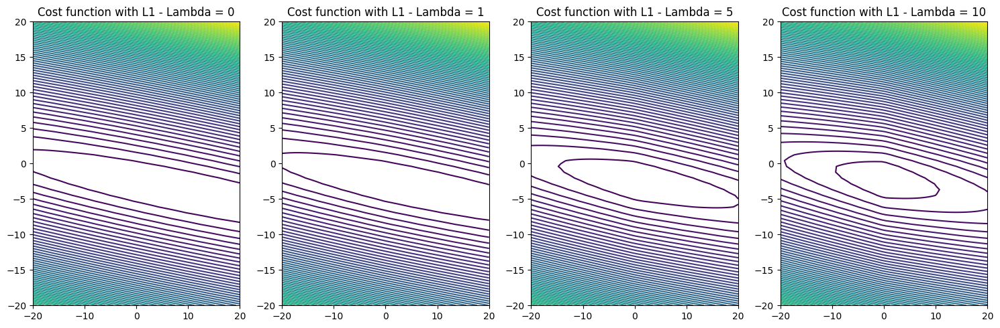

Cost Functions with L2 Regularization:


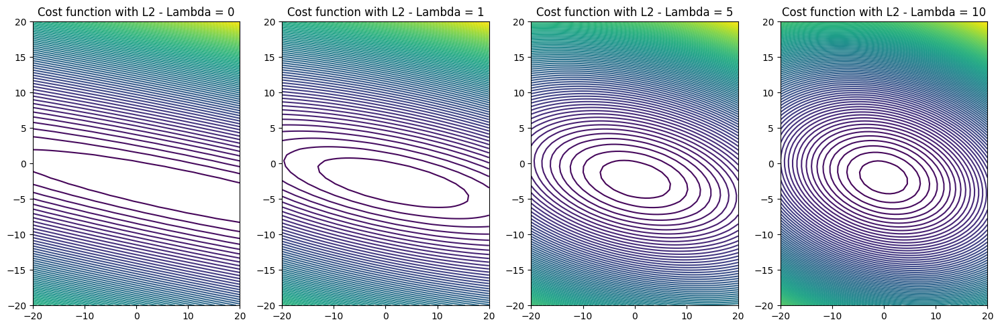

In [ ]:
reg_list = [0, 1, 5, 10]

# L1 Reg
print("Cost Functions with L1 Regularization:")
fig, axes = plt.subplots(ncols=len(reg_list), nrows=1, figsize=(15, 5))

for i, reg_coef in enumerate(reg_list):
  plot_contour(cost_plus_l1, [-20,20], [-20,20], 50, axes[i], reg_coef)
  axes[i].set_title(f'Cost function with L1 - Lambda = {reg_coef}')

plt.tight_layout() # Adjust layout to avoid overlapping labels
plt.show()

# L2 Reg
print("Cost Functions with L2 Regularization:")
fig, axes = plt.subplots(ncols=len(reg_list), nrows=1, figsize=(15, 5))

for i, reg_coef in enumerate(reg_list):
  plot_contour(cost_plus_l2, [-20,20], [-20,20], 50, axes[i], reg_coef)
  axes[i].set_title(f'Cost function with L2 - Lambda = {reg_coef}')

plt.tight_layout() # Adjust layout to avoid overlapping labels
plt.show()

**Observations of the Above Plots**:

Loss Function with L1 Regularization:
* **Without Regularization ($\lambda = 0$)**, the cost function contours are linear (almost parallel lines), corresponding to the pure cost function (without penalties) for a linear relationship.
* **As λ increases**, the contours of the cost function begin to form more complex shapes: **the contours take on a diamond-like shape**. This is because L1 regularization tends to force weights toward zero, which is reflected in the sharper corners of the contours. The sharpness around the origin means that gradient descent is more likely to **drive some weights exactly to zero, promoting sparsity in the model** (i.e. some features are dropped entirely from the model).

Loss Function with L2 Regularization:
* **Without Regularization ($\lambda = 0$)**, the cost function is the same.
* **As λ increases**, the L2 penalty creates contours that are **increasingly circular and smooth**. This reflects how L2 regularization **penalizes large weights but does not drive them to zero as aggressively as L1**.

#### **4.4 - Effect of L1 & L2 on Gradient Descent**

Gradient Descent with L1 Regularization:


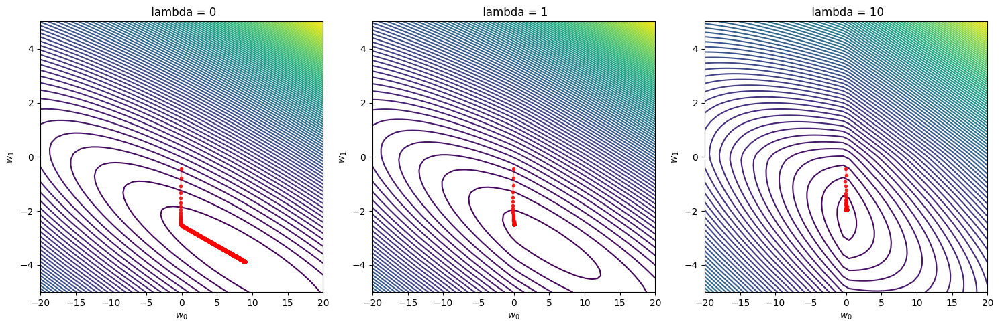

Gradient Descent with L2 Regularization:


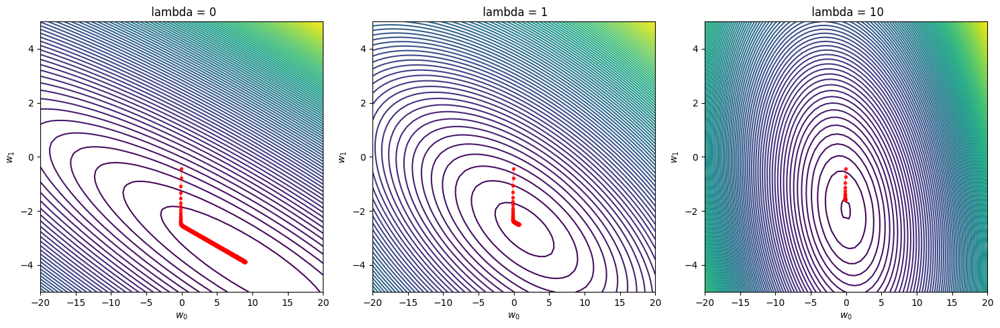

In [ ]:
reg_list = [0, 1, 10]

# L1 Reg
print("Gradient Descent with L1 Regularization:")
fig, axes = plt.subplots(ncols=len(reg_list), nrows=1, figsize=(15, 5))
for i, reg_coef in enumerate(reg_list):

  # Fit model:
  model = LinearRegressionRegularizedSGD(lr=0.01, max_iters=10e3, batch_size=len(x_train), record_history = True, verbose = False, l1_reg = reg_coef, l2_reg = 0)
  model.fit(x_entries, y_entries)

  # Compute
  current_cost = lambda w: cost_plus_l1(w, reg_coef)
  w_hist = np.vstack(model.optimizer.history)

  # Plot
  plot_contour(current_cost, [-20,20], [-5,5], 50, axes[i])
  axes[i].plot(w_hist[:,1], w_hist[:,0], '.r', alpha=.8)
  axes[i].plot(w_hist[:,1], w_hist[:,0], '-r', alpha=.3)
  axes[i].set_xlabel(r'$w_0$')
  axes[i].set_ylabel(r'$w_1$')
  axes[i].set_title(f' lambda = {reg_coef}')
  axes[i].set_xlim([-20,20])
  axes[i].set_ylim([-5,5])
plt.tight_layout() # Adjust layout to avoid overlapping labels
plt.show()


# L2 Reg
print("Gradient Descent with L2 Regularization:")
fig, axes = plt.subplots(ncols=len(reg_list), nrows=1, constrained_layout=True, figsize=(15, 5))
for i, reg_coef in enumerate(reg_list):

  # Fit model:
  model = LinearRegressionRegularizedSGD(lr=0.01, max_iters=10e3, batch_size=len(x_train), record_history = True, verbose = False, l1_reg = 0, l2_reg = reg_coef)
  model.fit(x_entries, y_entries)

  # Compute
  current_cost = lambda w: cost_plus_l2(w, reg_coef)
  w_hist = np.vstack(model.optimizer.history)

  # Plot
  plot_contour(current_cost, [-20,20], [-5,5], 50, axes[i])
  axes[i].plot(w_hist[:,1], w_hist[:,0], '.r', alpha=.8)
  axes[i].plot(w_hist[:,1], w_hist[:,0], '-r', alpha=.3)
  axes[i].set_xlabel(r'$w_0$')
  axes[i].set_ylabel(r'$w_1$')
  axes[i].set_title(f' lambda = {reg_coef}')
  axes[i].set_xlim([-20,20])
  axes[i].set_ylim([-5,5])
plt.tight_layout() # Adjust layout to avoid overlapping labels
plt.show()

**Observations of the Above Plots**:

**Gradient Descent with L1 Regularization**:
* **Without Regularization ($\lambda = 0$)**, the path follows a smooth, direct curve toward the minimum without any constraint on the weights.
* **As $\lambda$ increases**, L1 pushes weights toward zero more aggressively, causing the path to align with one of the axes. This reflects L1's promotion of **sparsity**, which encourages feature selection, which results in **faster convergence** and reduced **overfitting**
* **Compared to L2**, L1 forces one of the weights (in this case, $w_0$) to shrink faster and can set it to zero, encouraging sparse models.

**Gradient Descent with L2 Regularization**:
* **Without Regularization ($\lambda = 0$)**, the path is smooth, unconstrained, and similar to L1, moving directly toward the minimum.
* **As $\lambda$ increases**, L2 shrinks weights more uniformly, resulting in smoother, circular paths, as all weights are gradually reduced without being forced to zero, which **improves convergence as the isocontours become more convex**.
* **Compared to L1**, L2 does not zero out weights but instead reduces their magnitude evenly, leading to smoother convergence paths without axis alignment.

#### **4.5 - Overall Effects of L1 & L2 Regularization**

In this final subsection, we will discuss the main takeaways of the effects of L1 and L2 Regularization based on previous our observations of this section's plots.

**How L1 regularization encourages sparsity (setting some weights to zero)**:

We have seen in the previous subsections how L1 regularization effectively works by **adding a penalty ($||w||_1$)** to the Linear Regression's loss function. This penalty encourages the model to **drive some weights to exactly zero** effectively performing a feature selection. In doing so, L1 creates a sparser model, thereby reducing model complexity and prevents overfitting. As a result, we observe **improved convergence** as the optimizer handles fewer non-zero parameters, focusing only on the most significant features.

**How L2 regularization penalizes large weights but does not promote sparsity like L1:**
On the other hand, L2 regularization **penalizes large weights by adding a ($||w||_2^2$) term** to the loss function. This encourages all weights to shrink toward zero, but **unlike L1, no weights are set to exactly zero**. Instead, L2 applies a **smoother, more uniform reduction** in the weights. This results in a model that still prevents overfitting by limiting the effect of large coefficients, but **retains all the model's features**. As a result, L2 tends to provide a more stable descent path during gradient descent, **reducing oscillations and ensuring a smoother convergence**.

**How different values of λ affect the optimization paths and loss landscapes:**
The regularization strength ($\lambda$) controls how harshly each weight is penalized. For lower values of $\lambda$, the regularization has a lower effect, allowing the model to fit the training data more closely but risking overfitting. As $\lambda$ increases, both L1 and L2 regularization alter the loss landscape, with L1 leading to sharper, square-like contours (reflecting its promotion of sparsity) and L2 creating smoother, circular contours that uniformly shrink the weights. L1's sharp contours make gradient descent paths more direct, while L2's smooth contours improve convexity leading to smoother convergence paths without axis alignment.

## **Task 5: Creative Additions**

Ideas for additional topics (to implement later):
- Apply both L1 & L2 at same time (see Elastic Net)
- Apply Gaussian bases to task 4? or is that already done in t3?


#### **5.1 - Applying L1 & L2 Regularization (Elastic Net) together:**
In this subsection we will explore the idea of applying L1 & L2 Regularization together and evaluating how increasing the lambda affects the linear fit of the data.

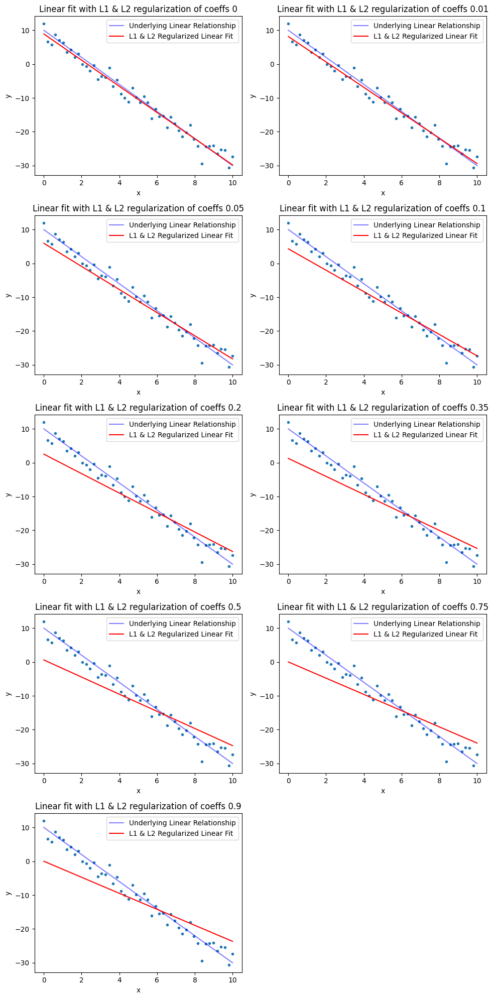

In [ ]:
# Define grid of subplots - standard model with 9 levels of regularization for L1
fig, axes = plt.subplots(5, 2, figsize=(10, 20))
axes = axes.ravel()                                                             # Flatten axes for easy iteration
reg_levels = [0, 0.01, 0.05, 0.1, 0.2, 0.35, 0.5, 0.75, 0.9]
grid_i = 0

# Iterate through values of lambda
for i in range(len(l1_regularization_levels)):
  # Fit:
  yh = train_and_fit_regularization(x_entries, y_entries, lr=0.01, max_iters = 10e3, l1_reg = reg_levels[i], l2_reg = reg_levels[i], D=0)

  # Plot:
  axes[grid_i].plot(x_entries, y_entries, '.')
  axes[grid_i].plot(x_entries, unbiased_y_entries, 'b-', label='Underlying Linear Relationship', alpha=0.5)
  axes[grid_i].plot(x_entries, yh, 'r-', label="L1 & L2 Regularized Linear Fit")
  axes[grid_i].set_xlabel('x')
  axes[grid_i].set_ylabel('y')
  axes[grid_i].legend()
  axes[grid_i].set_title(f"Linear fit with L1 & L2 regularization of coeffs "+str(l1_regularization_levels[i]))
  grid_i += 1

# Show Plot:
plt.tight_layout()                                                              # Adjust layout to avoid overlapping labels
axes[-1].set_visible(False)                                            # Hide the 10th subplot
plt.show()

#### **5.2 - Effect of Elastic Net on Loss Function**

**Visualizing the Regularization Penalties:**

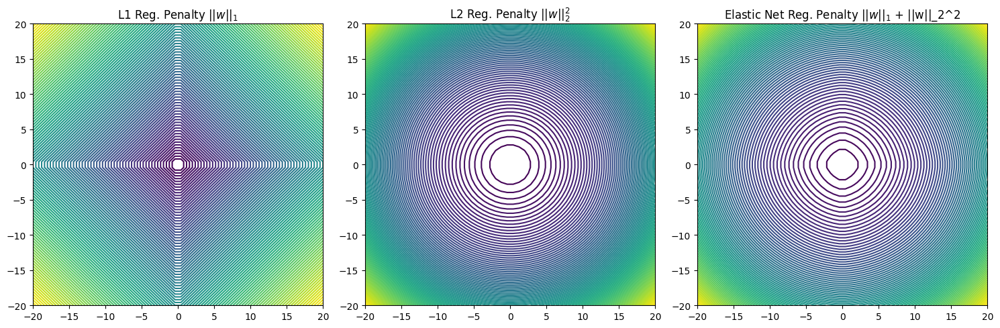

In [ ]:
# Redefining our Contour Plotting Function:
def plot_contour2(f, x1bound, x2bound, resolution, ax, l1=-1, l2=-1):
    x1range = np.linspace(x1bound[0], x1bound[1], resolution)
    x2range = np.linspace(x2bound[0], x2bound[1], resolution)
    xg, yg = np.meshgrid(x1range, x2range)
    zg = np.zeros_like(xg)
    for i,j in itertools.product(range(resolution), range(resolution)):
        if l1 < 0 and l2 < 0:
          zg[i,j] = f([xg[i,j], yg[i,j]])

        else:
          zg[i,j] = f([xg[i,j], yg[i,j]], l1, l2)

    ax.contour(xg, yg, zg, 100)
    return ax


# Defining a combined loss function:
l1_l2_penalties = lambda w: l1_penalty(w) + l2_penalty(w)
cost_elastic_net = lambda w, l1, l2: cost(w) + l1 * l1_penalty(w) + l2 * l2_penalty(w)

# Plotting our Cost Function, L1 Reg. Penalty, L2 Reg. Penalty
fig, axes = plt.subplots(ncols=3, nrows=1, figsize=(15, 5))

  #L1 Penalty
plot_contour2(l1_penalty, [-20,20], [-20,20], 50, axes[0])
axes[0].set_title(r'L1 Reg. Penalty $||w||_1$')

  #L2 Penalty
plot_contour2(l2_penalty, [-20,20], [-20,20], 50, axes[1])
axes[1].set_title(r'L2 Reg. Penalty $||w||_2^2$')

  #L1 & L2 Penalty
plot_contour2(l1_l2_penalties, [-20,20], [-20,20], 50, axes[2])
axes[2].set_title(r'Elastic Net Reg. Penalty $||w||_1$ + ||w||_2^2')

plt.tight_layout()
plt.show()

**Effect of varying combinations of L1 and L2 lambdas on the Loss Function:**

Cost Functions with L1 > L2 Regularization:


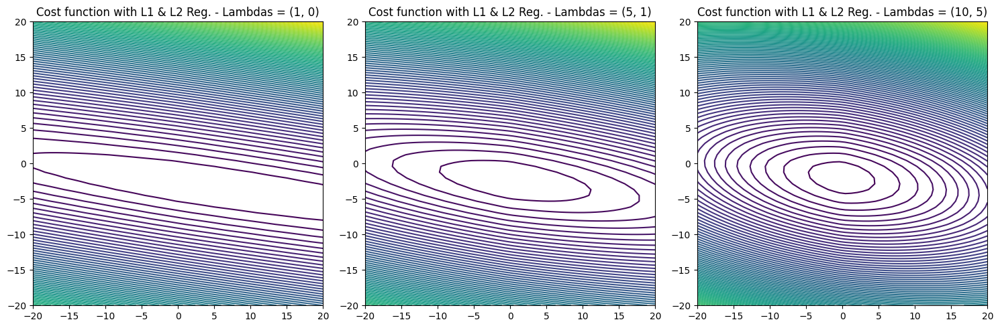

Cost Functions with L2 > L1 Regularization:


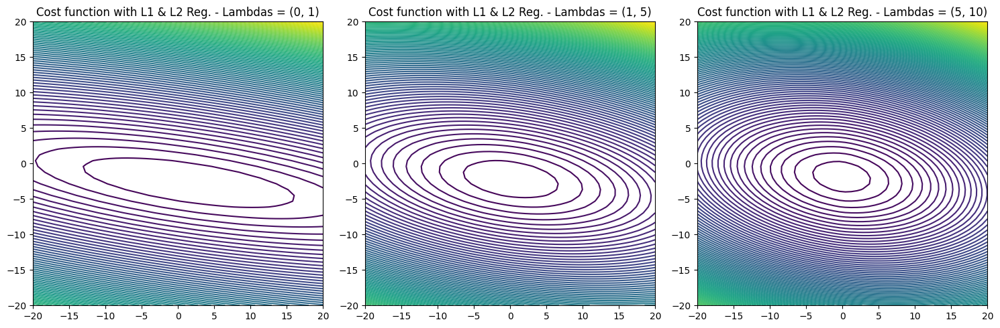

Cost Functions with L1 = L2 Regularization:


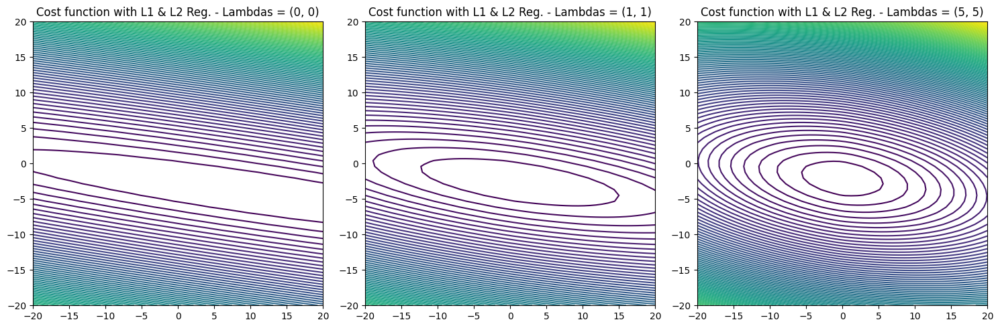

In [ ]:
reg_list = [0, 1, 5, 10]

# L1 > L2 Reg
print("Cost Functions with L1 > L2 Regularization:")
fig, axes = plt.subplots(ncols=len(reg_list) - 1, nrows=1, figsize=(15, 5))

for i in range(len(reg_list) - 1):
  l1 = reg_list[i+1]
  l2 = reg_list[i]
  plot_contour2(cost_elastic_net, [-20,20], [-20,20], 50, axes[i], l1, l2)
  axes[i].set_title(f'Cost function with L1 & L2 Reg. - Lambdas = {(l1, l2)}')

plt.tight_layout() # Adjust layout to avoid overlapping labels
plt.show()


# L2 > L1 Reg
print("Cost Functions with L2 > L1 Regularization:")
fig, axes = plt.subplots(ncols=len(reg_list) - 1, nrows=1, figsize=(15, 5))

for i in range(len(reg_list) - 1):
  l1 = reg_list[i]
  l2 = reg_list[i+1]
  plot_contour2(cost_elastic_net, [-20,20], [-20,20], 50, axes[i], l1, l2)
  axes[i].set_title(f'Cost function with L1 & L2 Reg. - Lambdas = {(l1, l2)}')

plt.tight_layout() # Adjust layout to avoid overlapping labels
plt.show()



# L2 = L1 Reg
print("Cost Functions with L1 = L2 Regularization:")
fig, axes = plt.subplots(ncols=len(reg_list) - 1, nrows=1, figsize=(15, 5))

for i in range(len(reg_list) - 1):
  l1 = reg_list[i]
  l2 = reg_list[i]
  plot_contour2(cost_elastic_net, [-20,20], [-20,20], 50, axes[i], l1, l2)
  axes[i].set_title(f'Cost function with L1 & L2 Reg. - Lambdas = {(l1, l2)}')

plt.tight_layout() # Adjust layout to avoid overlapping labels
plt.show()

#### **5.3 - Effect of Elastic Net on Gradient Descent**

Gradient Descent with L1 Lambda > L2 Lambda Regularization:


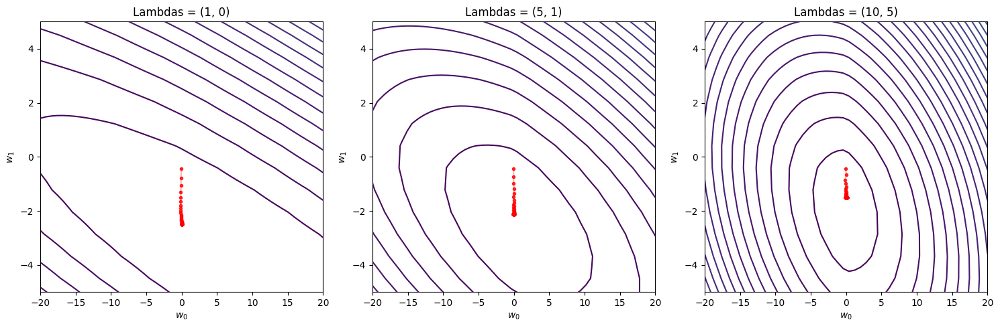

Gradient Descent with L1 Lambda < L2 Lambda Regularization:


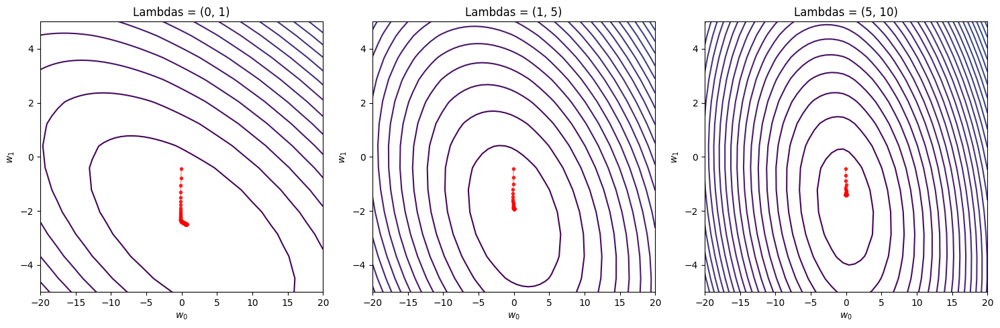

Gradient Descent with L1 Lambda = L2 Lambda Regularization:


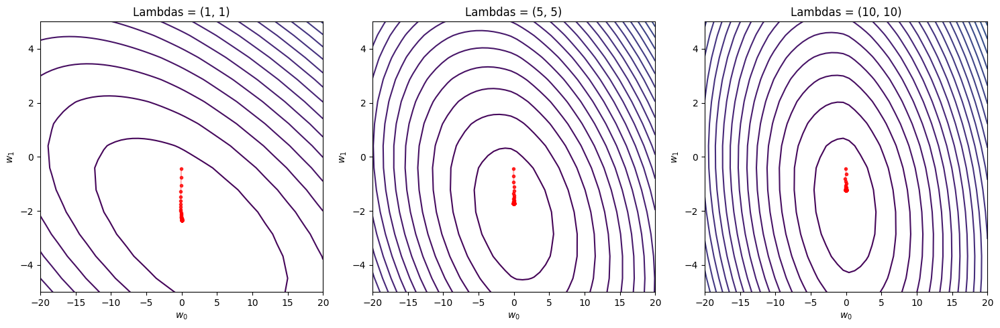

In [ ]:
reg_list = [0, 1, 5, 10]
regs_l1 = [1, 0, 1]
regs_l2 = [0, 1, 1]

# L1 > L2 Reg


for j in range(3):
  mode = ['>', '<', '=']
  l1
  print(f"Gradient Descent with L1 Lambda {mode[j]} L2 Lambda Regularization:")

  fig, axes = plt.subplots(ncols=len(reg_list) - 1, nrows=1, figsize=(15, 5))

  for i in range(len(reg_list) - 1):

    l1 = reg_list[i + regs_l1[j]]
    l2 = reg_list[i + regs_l2[j]]

    # Fit model:
    model = LinearRegressionRegularizedSGD(lr=0.01, max_iters=10e3, batch_size=len(x_train), record_history = True, verbose = False, l1_reg = l1, l2_reg = l2 )
    model.fit(x_entries, y_entries)

    # Compute
    current_cost = lambda w: cost_elastic_net(w, l1, l2)
    w_hist = np.vstack(model.optimizer.history)

    # Plot
    plot_contour2(cost_elastic_net, [-20,20], [-20,20], 50, axes[i], l1, l2)
    axes[i].plot(w_hist[:,1], w_hist[:,0], '.r', alpha=.8)
    axes[i].plot(w_hist[:,1], w_hist[:,0], '-r', alpha=.3)
    axes[i].set_xlabel(r'$w_0$')
    axes[i].set_ylabel(r'$w_1$')
    axes[i].set_title(f'Lambdas = {(l1, l2)}')
    axes[i].set_xlim([-20,20])
    axes[i].set_ylim([-5,5])
  plt.tight_layout() # Adjust layout to avoid overlapping labels
  plt.show()

